# Projet ML in the Cloud

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from sklearn.ensemble import ExtraTreesClassifier
warnings.filterwarnings('ignore')
%matplotlib inline
import re
from bs4 import BeautifulSoup
from imblearn.under_sampling import RandomUnderSampler
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords 
import nltk
nltk.download('stopwords')
nltk.download('wordnet') 
nltk.download('omw-1.4')
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import HashingVectorizer
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import numpy as np
from sklearn.utils import shuffle

from PIL import Image
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.decomposition import PCA
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import StratifiedKFold, cross_validate, train_test_split, cross_val_score, KFold
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.metrics import roc_curve, auc, classification_report, confusion_matrix, precision_score, recall_score,  accuracy_score, precision_recall_curve

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/sarah.harouni/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/sarah.harouni/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     /Users/sarah.harouni/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


# Preprocessing

In [4]:
df = pd.read_csv('Emotions_train.csv')
df1 = df.copy()

In [5]:
display(df1.head())
display(df1.tail())

,Text,Emotion
0,i didnt feel humiliated,sadness
1,i can go from feeling so hopeless to so damned...,sadness
2,im grabbing a minute to post i feel greedy wrong,anger
3,i am ever feeling nostalgic about the fireplac...,love
4,i am feeling grouchy,anger


,Text,Emotion
21454,Melissa stared at her friend in dism,fear
21455,Successive state elections have seen the gover...,fear
21456,Vincent was irritated but not dismay,fear
21457,Kendall-Hume turned back to face the dismayed ...,fear
21458,"I am dismayed , but not surpris",fear


In [6]:
df1.groupby('Emotion')['Text'].count()

Emotion
anger       2993
fear        2652
joy         7029
love        1641
sadness     6265
surprise     879
Name: Text, dtype: int64

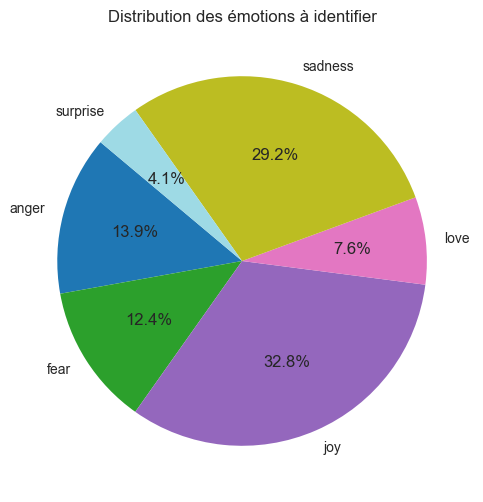

In [7]:
emotion_counts = df1.groupby('Emotion')['Text'].count()

plt.figure(figsize=(10, 6))
emotion_counts.plot(kind='pie', autopct='%1.1f%%', startangle=140, cmap='tab20')
plt.title('Distribution des émotions à identifier')
plt.ylabel('')
plt.show()

## Undersampling

In [8]:
X = df1.drop('Emotion', axis=1)
y = df1['Emotion']

rus = RandomUnderSampler(random_state=42)
X_res, y_res = rus.fit_resample(X, y)

df_balanced = pd.concat([X_res, y_res], axis=1)

print(df_balanced['Emotion'].value_counts())


Emotion
anger       879
fear        879
joy         879
love        879
sadness     879
surprise    879
Name: count, dtype: int64


In [9]:
df1 = df_balanced.copy()

In [10]:
df1 = pd.get_dummies(df1, columns=['Emotion'], drop_first=True)
display(df1.head())
display(df1.tail())

,Text,Emotion_fear,Emotion_joy,Emotion_love,Emotion_sadness,Emotion_surprise
2953,i feel greedy with my self as of late,False,False,False,False,False
5762,i may not be completely sure on a lot of thing...,False,False,False,False,False
17984,i came out of the airport that makes me feel i...,False,False,False,False,False
369,i should feel complimented or insulted,False,False,False,False,False
7092,i write what i feel if you get annoyed and sic...,False,False,False,False,False


,Text,Emotion_fear,Emotion_joy,Emotion_love,Emotion_sadness,Emotion_surprise
20891,If the birds are disturbed during the process ...,False,False,False,False,True
20892,It was Blackberry who bullied the stupefied Pi...,False,False,False,False,True
20893,"He woke stupefied , flicking his tongue over h...",False,False,False,False,True
20894,Laura stared up at Ross in stupefied ama,False,False,False,False,True
20895,The pain had faded into the background and she...,False,False,False,False,True


In [11]:
df2 = df.copy()
display(df2.head())
display(df2.tail())

,Text,Emotion
0,i didnt feel humiliated,sadness
1,i can go from feeling so hopeless to so damned...,sadness
2,im grabbing a minute to post i feel greedy wrong,anger
3,i am ever feeling nostalgic about the fireplac...,love
4,i am feeling grouchy,anger


,Text,Emotion
21454,Melissa stared at her friend in dism,fear
21455,Successive state elections have seen the gover...,fear
21456,Vincent was irritated but not dismay,fear
21457,Kendall-Hume turned back to face the dismayed ...,fear
21458,"I am dismayed , but not surpris",fear


## Traitement de la colonne Text

In [12]:
%time df2['Text_Processed'] = df2['Text'].map(lambda x : ' '.join(re.sub("(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)"," ",x).split()))
df2.head()

CPU times: user 133 ms, sys: 2.36 ms, total: 135 ms
Wall time: 135 ms


,Text,Emotion,Text_Processed
0,i didnt feel humiliated,sadness,i didnt feel humiliated
1,i can go from feeling so hopeless to so damned...,sadness,i can go from feeling so hopeless to so damned...
2,im grabbing a minute to post i feel greedy wrong,anger,im grabbing a minute to post i feel greedy wrong
3,i am ever feeling nostalgic about the fireplac...,love,i am ever feeling nostalgic about the fireplac...
4,i am feeling grouchy,anger,i am feeling grouchy


In [13]:
%time df2['Text_Processed'] = df2['Text'].map(lambda x: x.lower())
df2.head()

CPU times: user 2.61 ms, sys: 356 µs, total: 2.97 ms
Wall time: 2.96 ms


,Text,Emotion,Text_Processed
0,i didnt feel humiliated,sadness,i didnt feel humiliated
1,i can go from feeling so hopeless to so damned...,sadness,i can go from feeling so hopeless to so damned...
2,im grabbing a minute to post i feel greedy wrong,anger,im grabbing a minute to post i feel greedy wrong
3,i am ever feeling nostalgic about the fireplac...,love,i am ever feeling nostalgic about the fireplac...
4,i am feeling grouchy,anger,i am feeling grouchy


In [14]:
%time df2['Text_Processed'] = df2['Text'].map(lambda x: re.sub(r'[^\w\s]', '', x))
df2.head()

CPU times: user 32.8 ms, sys: 1.31 ms, total: 34.1 ms
Wall time: 33.2 ms


,Text,Emotion,Text_Processed
0,i didnt feel humiliated,sadness,i didnt feel humiliated
1,i can go from feeling so hopeless to so damned...,sadness,i can go from feeling so hopeless to so damned...
2,im grabbing a minute to post i feel greedy wrong,anger,im grabbing a minute to post i feel greedy wrong
3,i am ever feeling nostalgic about the fireplac...,love,i am ever feeling nostalgic about the fireplac...
4,i am feeling grouchy,anger,i am feeling grouchy


In [15]:
%time df2['Text_Processed'] = df2['Text'].map(lambda x : re.sub(r'[^\x00-\x7F]+',' ', x))
df2.head()

CPU times: user 47.2 ms, sys: 1.99 ms, total: 49.2 ms
Wall time: 48.2 ms


,Text,Emotion,Text_Processed
0,i didnt feel humiliated,sadness,i didnt feel humiliated
1,i can go from feeling so hopeless to so damned...,sadness,i can go from feeling so hopeless to so damned...
2,im grabbing a minute to post i feel greedy wrong,anger,im grabbing a minute to post i feel greedy wrong
3,i am ever feeling nostalgic about the fireplac...,love,i am ever feeling nostalgic about the fireplac...
4,i am feeling grouchy,anger,i am feeling grouchy


In [16]:
def remove_digits_and_values(text, values):
    text = re.sub(r'\b\w*\d\w*\b', '', text)
    for value in values:
        text = text.replace(value, '')
    return text

%time df2['Text_Processed'] = df2['Text_Processed'].apply(lambda x: remove_digits_and_values(x, values_to_find))
print(df2.Text_Processed[df2.Text_Processed.str.contains('.*[0-9].*', regex=True)])

NameError: name 'values_to_find' is not defined

20023    However , in 1878 , deaf education in Greenock...
20029    He 's a very contented baby , a joy to his par...
20039    A host of splendid 19th century rooms througho...
20069    I am ecstatic about this , it is like winning ...
20075    More then 40,000 ecstatic fans filled stadia e...
20079    Riot police were needed to quell pitch invasio...
20106    In fact they encouraged us most warmly , and w...
20157    He was gleeful about the idea of a Faber ` Vau...
20182    Paula , mother of Nicola , 4 , and Richard , 2...
20251    I have been sent a Leeds United 1993-94 squad ...
20319    As she looked around she felt a twinge of sadn...
20340    But the address underlines the anguish of Her ...
20357    Whether the cries of anguish for 1991 alone ar...
20380    But Kirkwood , who was a particularly dejected...
20391    In it a deeply depressed Spiro , 46 , makes se...
20408    When I was 15 I was in a depressed state and I...
20418    I 've heard of women so depressed that they sp.

In [17]:
df2['Text_Processed'] = df2['Text_Processed'].apply(lambda x: ''.join([i for i in x if not i.isdigit()]))
print(df2.Text_Processed[df2.Text_Processed.str.contains('.*[0-9].*', regex=True)])

Series([], Name: Text_Processed, dtype: object)


In [18]:
rx = re.compile(r'([^\W\d_])\1{2,}')

def correct_text(text):
    return re.sub(r'[^\W\d_]+', lambda x: Word(rx.sub(r'\1\1', x.group())).correct() if rx.search(x.group()) else x.group(), text)

%time df2['Text_Processed'] = df2['Text_Processed'].apply(correct_text)

df2

NameError: name 'Word' is not defined

,Text,Emotion,Text_Processed
0,i didnt feel humiliated,sadness,i didnt feel humiliated
1,i can go from feeling so hopeless to so damned...,sadness,i can go from feeling so hopeless to so damned...
2,im grabbing a minute to post i feel greedy wrong,anger,im grabbing a minute to post i feel greedy wrong
3,i am ever feeling nostalgic about the fireplac...,love,i am ever feeling nostalgic about the fireplac...
4,i am feeling grouchy,anger,i am feeling grouchy
...,...,...,...
21454,Melissa stared at her friend in dism,fear,Melissa stared at her friend in dism
21455,Successive state elections have seen the gover...,fear,Successive state elections have seen the gover...
21456,Vincent was irritated but not dismay,fear,Vincent was irritated but not dismay
21457,Kendall-Hume turned back to face the dismayed ...,fear,Kendall-Hume turned back to face the dismayed ...


# Stop-words

In [19]:
stop_words = stopwords.words('english')
%time df2['Text_Processed'] = df2['Text'].map(lambda x : ' '.join([w for w in x.split() if w not in stop_words]))
df2.head()

CPU times: user 235 ms, sys: 692 µs, total: 236 ms
Wall time: 237 ms


,Text,Emotion,Text_Processed
0,i didnt feel humiliated,sadness,didnt feel humiliated
1,i can go from feeling so hopeless to so damned...,sadness,go feeling hopeless damned hopeful around some...
2,im grabbing a minute to post i feel greedy wrong,anger,im grabbing minute post feel greedy wrong
3,i am ever feeling nostalgic about the fireplac...,love,ever feeling nostalgic fireplace know still pr...
4,i am feeling grouchy,anger,feeling grouchy


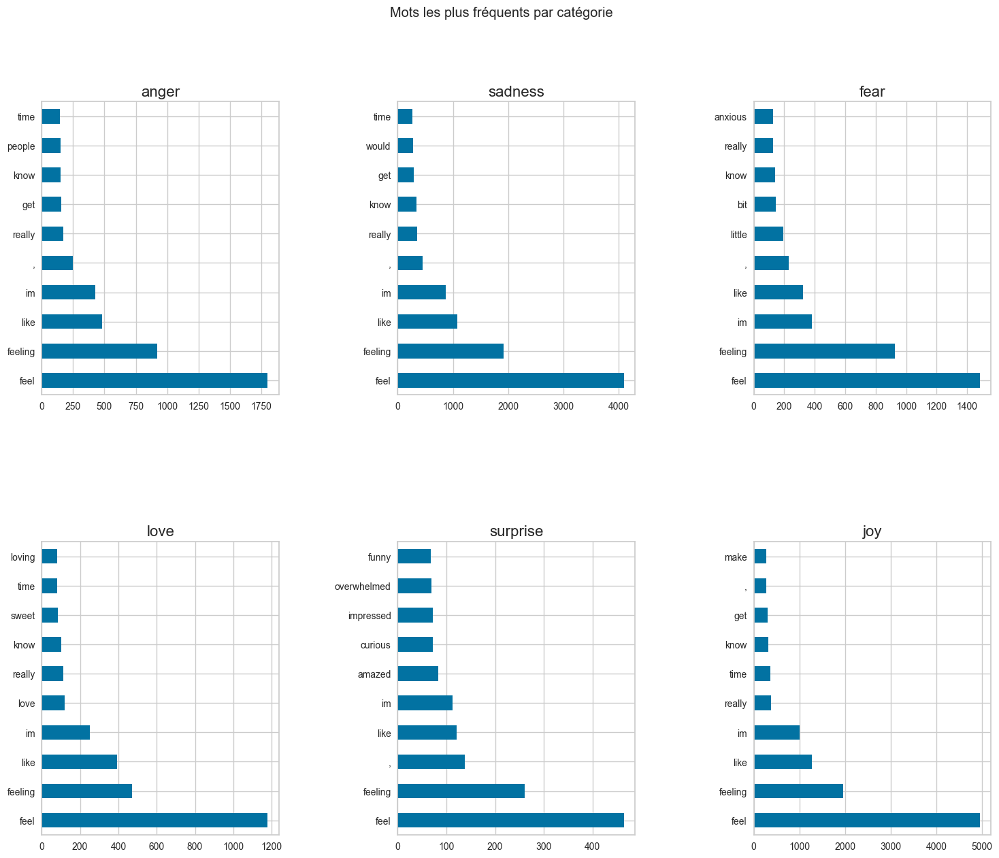

In [20]:
fig, axes = plt.subplots(2, 3, figsize=(18, 14))
fig.subplots_adjust(hspace=0.5,wspace=0.5)

fig.suptitle('Mots les plus fréquents par catégorie')

df2.loc[df2['Emotion']=='anger']['Text_Processed'].str.split(expand=True).stack().value_counts()[:10].plot(kind='barh', ax =axes[0,0]);
axes[0,0].set_title('anger',size=16)

df2.loc[df2['Emotion']=='sadness']['Text_Processed'].str.split(expand=True).stack().value_counts()[:10].plot(kind='barh', ax =axes[0,1]);
axes[0,1].set_title('sadness',size=16)

df2.loc[df2['Emotion']=='fear']['Text_Processed'].str.split(expand=True).stack().value_counts()[:10].plot(kind='barh', ax =axes[0,2]);
axes[0,2].set_title('fear',size=16)

df2.loc[df2['Emotion']=='love']['Text_Processed'].str.split(expand=True).stack().value_counts()[:10].plot(kind='barh', ax =axes[1,0]);
axes[1,0].set_title('love',size=16)

df2.loc[df2['Emotion']=='surprise']['Text_Processed'].str.split(expand=True).stack().value_counts()[:10].plot(kind='barh', ax =axes[1,1]);
axes[1,1].set_title('surprise',size=16)

df2.loc[df2['Emotion']=='joy']['Text_Processed'].str.split(expand=True).stack().value_counts()[:10].plot(kind='barh', ax =axes[1,2]);
axes[1,2].set_title('joy',size=16)
plt.show()

In [21]:
new_stopwords = ["feel","feeling",'im',"get","know","want","would","one"," i m ","still","ive","think","something","like","really","time","little","make","people","even","thing"]
stop_words.extend(new_stopwords)

In [22]:
%time df2['Text_Processed'] = df2['Text'].map(lambda x : ' '.join([w for w in x.split() if w not in stop_words]))
df2.head()

CPU times: user 252 ms, sys: 1.77 ms, total: 253 ms
Wall time: 254 ms


,Text,Emotion,Text_Processed
0,i didnt feel humiliated,sadness,didnt humiliated
1,i can go from feeling so hopeless to so damned...,sadness,go hopeless damned hopeful around someone care...
2,im grabbing a minute to post i feel greedy wrong,anger,grabbing minute post greedy wrong
3,i am ever feeling nostalgic about the fireplac...,love,ever nostalgic fireplace property
4,i am feeling grouchy,anger,grouchy


In [23]:
%time df2['Text_Processed'] = df2['Text_Processed'].map(lambda x: re.sub(r'[^\w\s]', '', x))
df2.head()

CPU times: user 11.3 ms, sys: 91 µs, total: 11.4 ms
Wall time: 11.4 ms


,Text,Emotion,Text_Processed
0,i didnt feel humiliated,sadness,didnt humiliated
1,i can go from feeling so hopeless to so damned...,sadness,go hopeless damned hopeful around someone care...
2,im grabbing a minute to post i feel greedy wrong,anger,grabbing minute post greedy wrong
3,i am ever feeling nostalgic about the fireplac...,love,ever nostalgic fireplace property
4,i am feeling grouchy,anger,grouchy


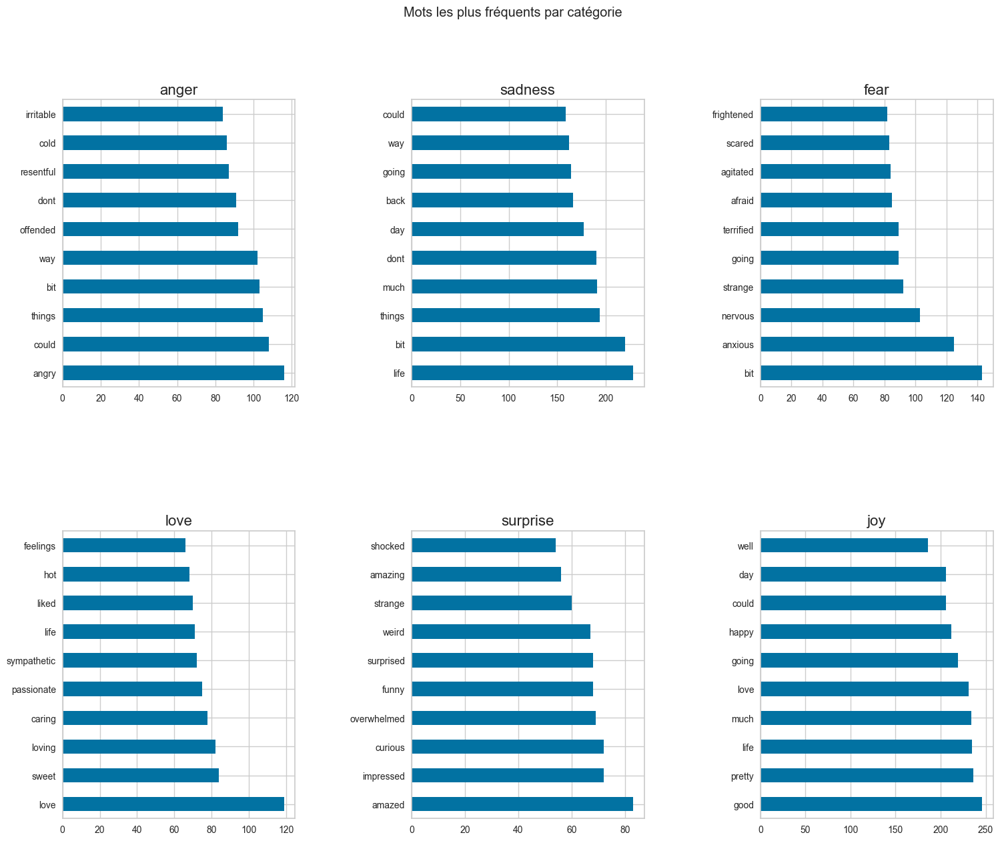

In [24]:
fig, axes = plt.subplots(2, 3, figsize=(18, 14))
fig.subplots_adjust(hspace=0.5,wspace=0.5)

fig.suptitle('Mots les plus fréquents par catégorie')

df2.loc[df2['Emotion']=='anger']['Text_Processed'].str.split(expand=True).stack().value_counts()[:10].plot(kind='barh', ax =axes[0,0]);
axes[0,0].set_title('anger',size=16)

df2.loc[df2['Emotion']=='sadness']['Text_Processed'].str.split(expand=True).stack().value_counts()[:10].plot(kind='barh', ax =axes[0,1]);
axes[0,1].set_title('sadness',size=16)

df2.loc[df2['Emotion']=='fear']['Text_Processed'].str.split(expand=True).stack().value_counts()[:10].plot(kind='barh', ax =axes[0,2]);
axes[0,2].set_title('fear',size=16)

df2.loc[df2['Emotion']=='love']['Text_Processed'].str.split(expand=True).stack().value_counts()[:10].plot(kind='barh', ax =axes[1,0]);
axes[1,0].set_title('love',size=16)

df2.loc[df2['Emotion']=='surprise']['Text_Processed'].str.split(expand=True).stack().value_counts()[:10].plot(kind='barh', ax =axes[1,1]);
axes[1,1].set_title('surprise',size=16)

df2.loc[df2['Emotion']=='joy']['Text_Processed'].str.split(expand=True).stack().value_counts()[:10].plot(kind='barh', ax =axes[1,2]);
axes[1,2].set_title('joy',size=16)
plt.show()

In [25]:
lemmer = WordNetLemmatizer()

%time df2['Text_Processed'] = df2['Text_Processed'].map(lambda x : ' '.join([lemmer.lemmatize(w) for w in x.split() if w not in stop_words]))
df2.head()

CPU times: user 826 ms, sys: 9.84 ms, total: 836 ms
Wall time: 838 ms


,Text,Emotion,Text_Processed
0,i didnt feel humiliated,sadness,didnt humiliated
1,i can go from feeling so hopeless to so damned...,sadness,go hopeless damned hopeful around someone care...
2,im grabbing a minute to post i feel greedy wrong,anger,grabbing minute post greedy wrong
3,i am ever feeling nostalgic about the fireplac...,love,ever nostalgic fireplace property
4,i am feeling grouchy,anger,grouchy


In [26]:
%time df2['Text_Processed'] = df2['Text_Processed'].map(lambda x : ' '.join([w for w in x.split() if w not in stop_words]))
display(df2.head())
display(df2.tail())

CPU times: user 150 ms, sys: 1.69 ms, total: 152 ms
Wall time: 151 ms


,Text,Emotion,Text_Processed
0,i didnt feel humiliated,sadness,didnt humiliated
1,i can go from feeling so hopeless to so damned...,sadness,go hopeless damned hopeful around someone care...
2,im grabbing a minute to post i feel greedy wrong,anger,grabbing minute post greedy wrong
3,i am ever feeling nostalgic about the fireplac...,love,ever nostalgic fireplace property
4,i am feeling grouchy,anger,grouchy


,Text,Emotion,Text_Processed
21454,Melissa stared at her friend in dism,fear,Melissa stared friend dism
21455,Successive state elections have seen the gover...,fear,Successive state election seen governing party...
21456,Vincent was irritated but not dismay,fear,Vincent irritated dismay
21457,Kendall-Hume turned back to face the dismayed ...,fear,KendallHume turned back face dismayed coup
21458,"I am dismayed , but not surpris",fear,I dismayed surpris


## Visualisations

In [27]:
def get_n_words(corpus, direction, n):
    vec = CountVectorizer(stop_words = 'english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    if direction == "top":
        words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    else:
        words_freq =sorted(words_freq, key = lambda x: x[1], reverse=False)
    return words_freq[:n]

In [28]:
common_words = get_n_words(df2['Text_Processed'], "top", 15)
rare_words = get_n_words(df2['Text_Processed'], "bottom", 15)

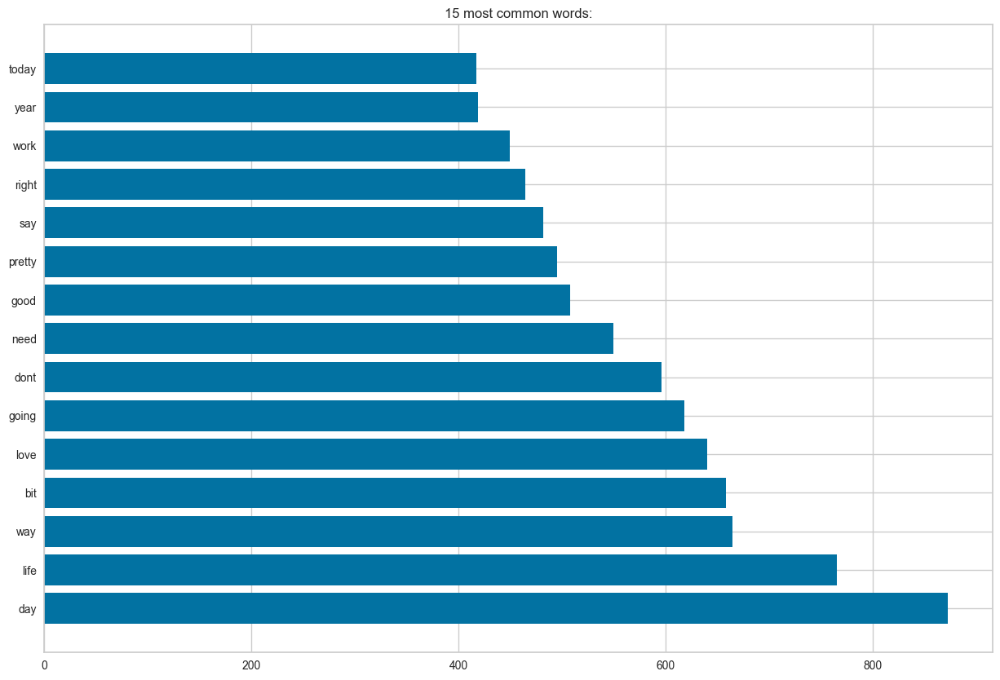

In [29]:
common_words = dict(common_words)
names = list(common_words.keys())
values = list(common_words.values())
plt.subplots(figsize = (15,10))
bars = plt.barh(range(len(common_words)),values,tick_label=names)
plt.title('15 most common words:')
plt.show()

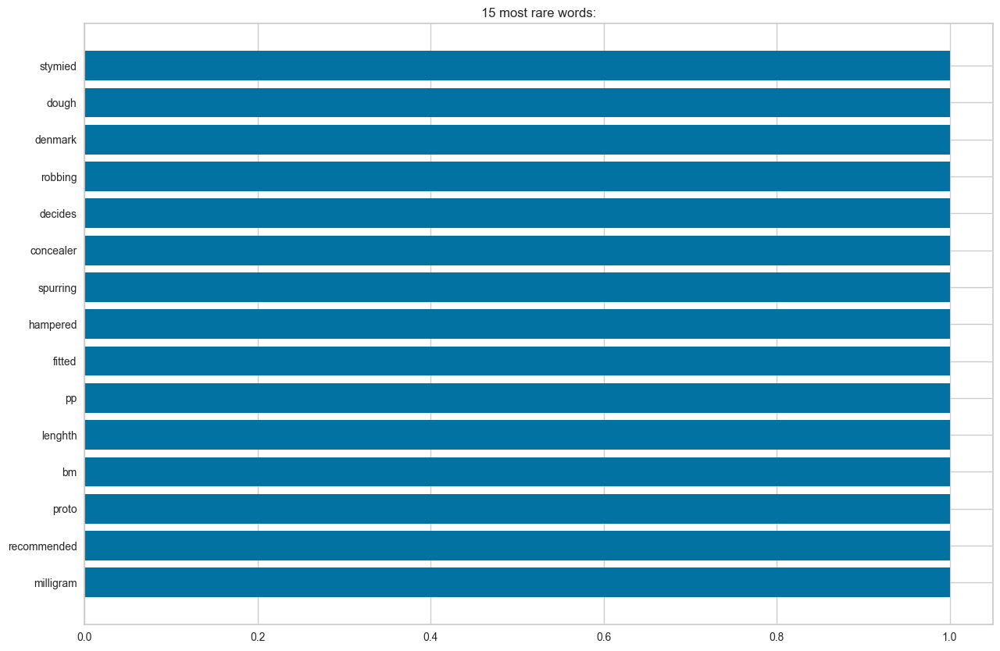

In [30]:
rare_words = dict(rare_words)
names = list(rare_words.keys())
values = list(rare_words.values())
plt.subplots(figsize = (15,10))
bars = plt.barh(range(len(rare_words)),values,tick_label=names)
plt.title('15 most rare words:')
plt.show()

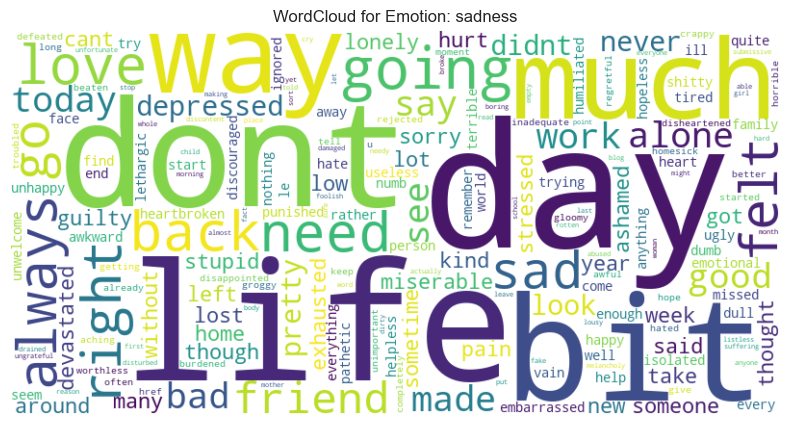

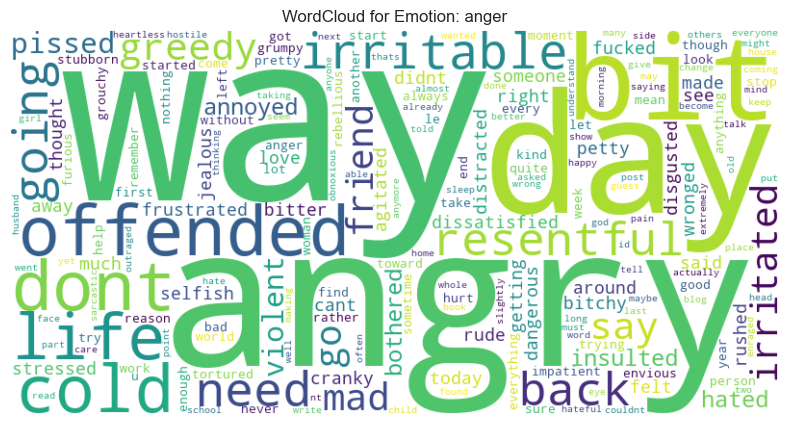

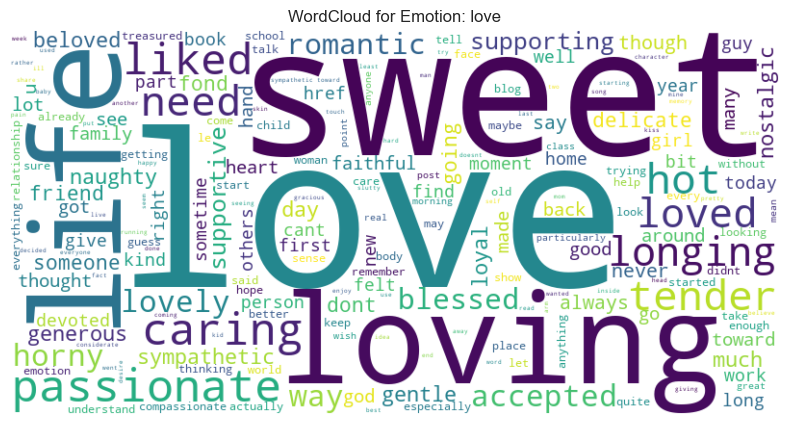

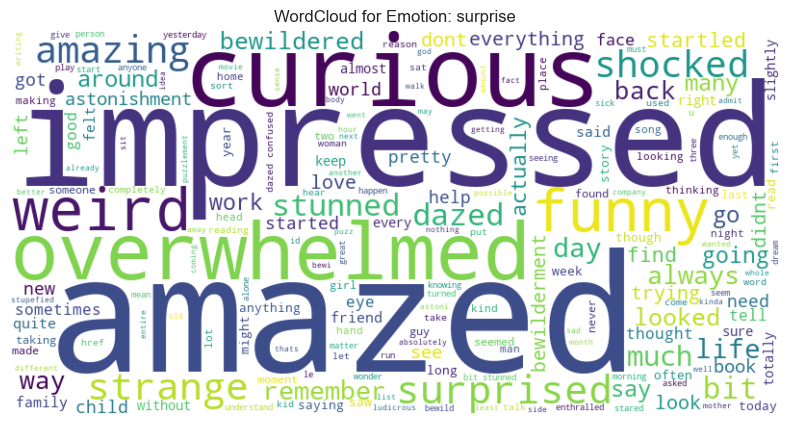

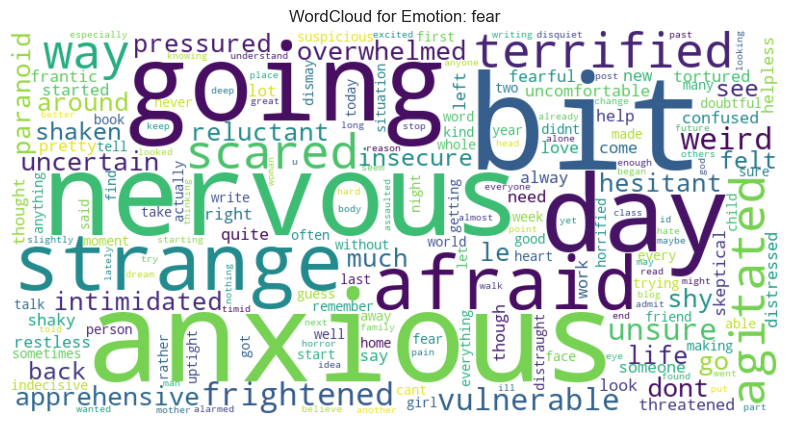

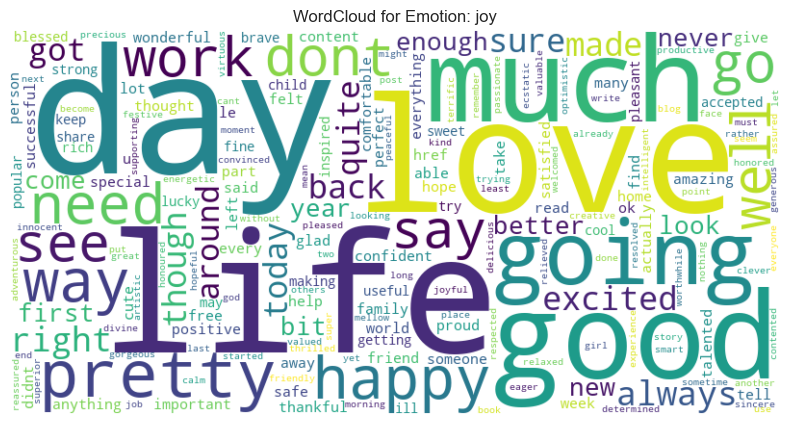

In [31]:
emotions = df2['Emotion'].unique()
for emotion in emotions:
    # Filtrer les textes par émotion
    text = ' '.join(df2[df2['Emotion'] == emotion]['Text_Processed'])
    
    # Générer le WordCloud
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    
    # Afficher le WordCloud
    plt.figure(figsize=(10, 5))
    plt.title(f'WordCloud for Emotion: {emotion}')
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.show()

## Embedding TF-Idf

In [32]:
tfidf_vectorizer = TfidfVectorizer(min_df=2, max_df=0.80, ngram_range=(1,1))

%time tpl_tfidf = tfidf_vectorizer.fit_transform(df2['Text_Processed'])
display("Bow-TF:IDF :", tpl_tfidf.shape)
df_tfidf = pd.DataFrame(tpl_tfidf.toarray(), columns=tfidf_vectorizer.get_feature_names_out(), index=df2.index)
display(df_tfidf.head())

CPU times: user 205 ms, sys: 3.18 ms, total: 208 ms
Wall time: 69.6 ms


'Bow-TF:IDF :'

(21459, 8270)

,10,11,15,1978,1991,30,aa,aaron,ab,abandon,...,zach,zealand,zen,zero,zest,zombie,zone,zoom,zooming,zumba
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [33]:
#Preparing processed and BoW-TF:IDF embedded data for Classification
df_tfidf_m = pd.concat([df2, df_tfidf], axis = 1)
df_tfidf_m.drop(columns=['Text', 'Text_Processed'], inplace = True)
print(df_tfidf_m.shape)
display(df_tfidf_m.head())
display(df_tfidf_m.tail())

(21459, 8271)


,Emotion,10,11,15,1978,1991,30,aa,aaron,ab,...,zach,zealand,zen,zero,zest,zombie,zone,zoom,zooming,zumba
0,sadness,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,sadness,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,anger,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,love,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,anger,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,Emotion,10,11,15,1978,1991,30,aa,aaron,ab,...,zach,zealand,zen,zero,zest,zombie,zone,zoom,zooming,zumba
21454,fear,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
21455,fear,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
21456,fear,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
21457,fear,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
21458,fear,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## ACP

Train Data Dimensions :  (15021, 8270)
Validation Data Dimensions :  (3219, 8270)
Test Data Dimensions :  (3219, 8270)


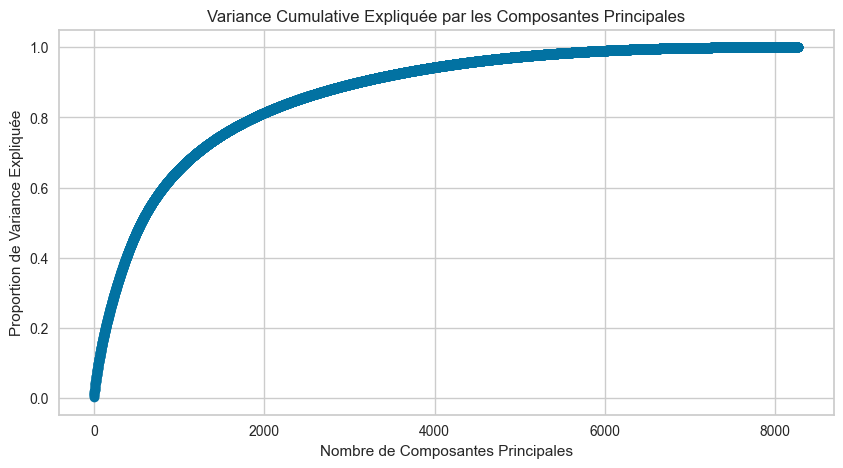

Nombre optimal de composantes pour expliquer 95.0% de la variance: 4190
Dimensions après ACP - Train:  (15021, 4190)
Dimensions après ACP - Validation:  (3219, 4190)
Dimensions après ACP - Test:  (3219, 4190)


In [34]:
# Charger les données
Y = df_tfidf_m['Emotion']
X = df_tfidf_m.drop('Emotion', axis=1)

# Séparer les données en train, validation et test
X_train, X_temp, Y_train, Y_temp = train_test_split(X, Y, train_size=0.70, stratify=Y, random_state=21)
X_val, X_test, Y_val, Y_test = train_test_split(X_temp, Y_temp, train_size=0.50, stratify=Y_temp, random_state=21)

print("Train Data Dimensions : ", X_train.shape)
print("Validation Data Dimensions : ", X_val.shape)
print("Test Data Dimensions : ", X_test.shape)

# Application de l'ACP
pca = PCA()
pca.fit(X_train)

# Visualisation de la variance expliquée
explained_variance = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance)

plt.figure(figsize=(10, 5))
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o', linestyle='--')
plt.title('Variance Cumulative Expliquée par les Composantes Principales')
plt.xlabel('Nombre de Composantes Principales')
plt.ylabel('Proportion de Variance Expliquée')
plt.grid(True)
plt.show()

# Nombre optimal de composantes pour expliquer 95% de la variance
threshold = 0.95
n_components_optimal = np.argmax(cumulative_variance >= threshold) + 1
print(f"Nombre optimal de composantes pour expliquer {threshold*100}% de la variance: {n_components_optimal}")

# Application de l'ACP avec le nombre optimal de composantes
pca = PCA(n_components=n_components_optimal)
X_train_pca = pca.fit_transform(X_train)
X_val_pca = pca.transform(X_val)
X_test_pca = pca.transform(X_test)

print("Dimensions après ACP - Train: ", X_train_pca.shape)
print("Dimensions après ACP - Validation: ", X_val_pca.shape)
print("Dimensions après ACP - Test: ", X_test_pca.shape)


# Version 1a : Création de modèle from scratch avec train.csv (5 émotions)

In [35]:
def model_dvt_2(X_train_pca, Y_train, X_val_pca, Y_val):
    classifiers = [
        ("Random Forest", RandomForestClassifier(n_estimators=400, criterion="entropy", random_state=21)),
        ("Extra Trees", ExtraTreesClassifier(n_estimators=400, criterion="entropy", random_state=21)),
        ("Gradient Boosting", GradientBoostingClassifier(n_estimators=100, max_depth=1, random_state=21, learning_rate=1.0)),
        ("Naive Bayes", MultinomialNB(alpha=0.5))
    ]
    
    for name, clf in classifiers:
        print("\n", name)
        %time clf.fit(X_train_pca, Y_train)
        Y_pred = clf.predict(X_val_pca)
        probs = clf.predict_proba(X_val_pca)
        clf_report_2(Y_val, Y_pred, name)

In [36]:
def clf_report_2(Y_test, Y_pred, clf_name):
    print("\n", f"Confusion Matrix - {clf_name}")
    cm = confusion_matrix(Y_test, Y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='YlGnBu', xticklabels=['sadness', 'anger', 'love', 'surprise', 'fear', 'joy'], yticklabels=['sadness', 'anger', 'love', 'surprise', 'fear', 'joy'])
    plt.xlabel('True Label')
    plt.ylabel('Predicted Label')
    plt.title(f'Confusion Matrix - {clf_name}')
    plt.show()
    
    print("\n", f"Classification Report - {clf_name}", "\n")
    print(classification_report(Y_test, Y_pred))
    print("Overall Accuracy : ", round(accuracy_score(Y_test, Y_pred) * 100, 2))
    print("Precision Score : ", round(precision_score(Y_test, Y_pred, average='weighted') * 100, 2))
    print("Recall Score : ", round(recall_score(Y_test, Y_pred, average='weighted') * 100, 2))
    print("--------------------------------------------------------------------------")



Models on Term Frequency - Bag of Words: Inverse Document Frequency data

 Random Forest
CPU times: user 2min 12s, sys: 732 ms, total: 2min 13s
Wall time: 2min 13s

 Confusion Matrix - Random Forest


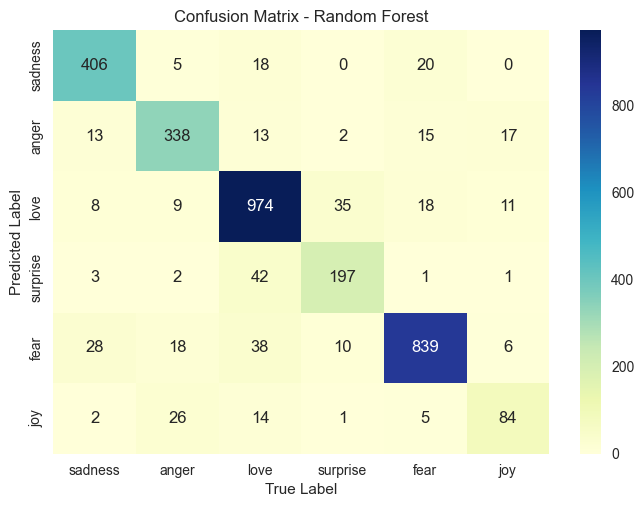


 Classification Report - Random Forest 

              precision    recall  f1-score   support

       anger       0.88      0.90      0.89       449
        fear       0.85      0.85      0.85       398
         joy       0.89      0.92      0.90      1055
        love       0.80      0.80      0.80       246
     sadness       0.93      0.89      0.91       939
    surprise       0.71      0.64      0.67       132

    accuracy                           0.88      3219
   macro avg       0.84      0.83      0.84      3219
weighted avg       0.88      0.88      0.88      3219

Overall Accuracy :  88.16
Precision Score :  88.15
Recall Score :  88.16
--------------------------------------------------------------------------

 Extra Trees
CPU times: user 3min 37s, sys: 194 ms, total: 3min 38s
Wall time: 3min 38s

 Confusion Matrix - Extra Trees


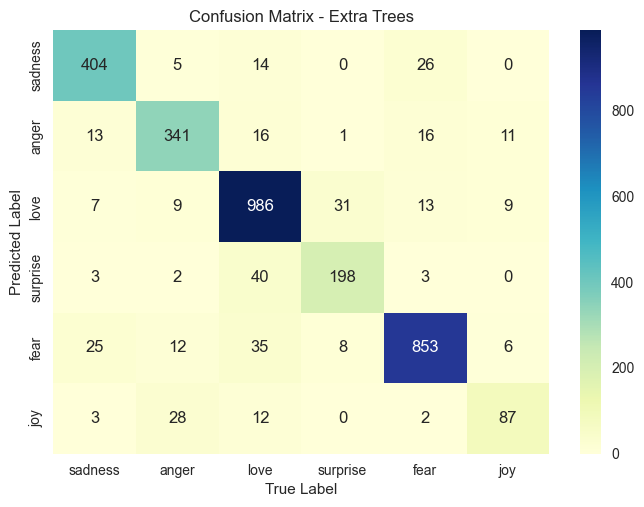


 Classification Report - Extra Trees 

              precision    recall  f1-score   support

       anger       0.89      0.90      0.89       449
        fear       0.86      0.86      0.86       398
         joy       0.89      0.93      0.91      1055
        love       0.83      0.80      0.82       246
     sadness       0.93      0.91      0.92       939
    surprise       0.77      0.66      0.71       132

    accuracy                           0.89      3219
   macro avg       0.86      0.84      0.85      3219
weighted avg       0.89      0.89      0.89      3219

Overall Accuracy :  89.13
Precision Score :  89.07
Recall Score :  89.13
--------------------------------------------------------------------------

 Gradient Boosting
CPU times: user 1min 48s, sys: 117 ms, total: 1min 48s
Wall time: 1min 48s

 Confusion Matrix - Gradient Boosting


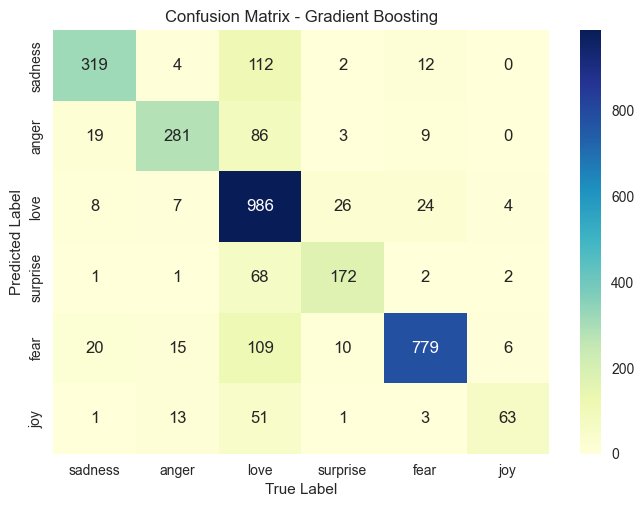


 Classification Report - Gradient Boosting 

              precision    recall  f1-score   support

       anger       0.87      0.71      0.78       449
        fear       0.88      0.71      0.78       398
         joy       0.70      0.93      0.80      1055
        love       0.80      0.70      0.75       246
     sadness       0.94      0.83      0.88       939
    surprise       0.84      0.48      0.61       132

    accuracy                           0.81      3219
   macro avg       0.84      0.73      0.77      3219
weighted avg       0.83      0.81      0.81      3219

Overall Accuracy :  80.77
Precision Score :  82.8
Recall Score :  80.77
--------------------------------------------------------------------------

 Naive Bayes
CPU times: user 2.14 s, sys: 14.1 ms, total: 2.16 s
Wall time: 382 ms

 Confusion Matrix - Naive Bayes


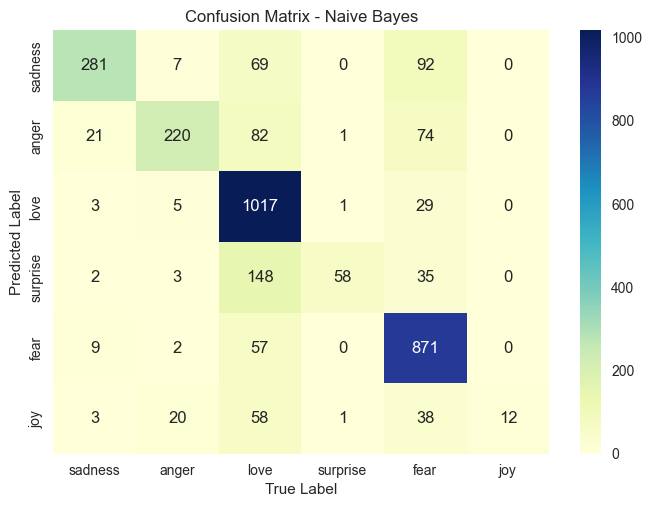


 Classification Report - Naive Bayes 

              precision    recall  f1-score   support

       anger       0.88      0.63      0.73       449
        fear       0.86      0.55      0.67       398
         joy       0.71      0.96      0.82      1055
        love       0.95      0.24      0.38       246
     sadness       0.76      0.93      0.84       939
    surprise       1.00      0.09      0.17       132

    accuracy                           0.76      3219
   macro avg       0.86      0.57      0.60      3219
weighted avg       0.80      0.76      0.73      3219

Overall Accuracy :  76.39
Precision Score :  79.84
Recall Score :  76.39
--------------------------------------------------------------------------
CPU times: user 7min 46s, sys: 2.89 s, total: 7min 49s
Wall time: 7min 44s


In [37]:
print('Models on Term Frequency - Bag of Words: Inverse Document Frequency data')
%time model_dvt_2(X_train, Y_train, X_val, Y_val)

## Version 1b : Pycaret avec train.csv

In [38]:
from pycaret.classification import *

In [40]:
df2 = df2[['Emotion','Text_Processed']]

In [42]:
%time df_train_setup = setup(data = df2, target = 'Emotion', train_size = 0.75,text_features=['Text_Processed'],fold=5,pca=True,pca_components=0.95) 

,Description,Value
0,Session id,7473
1,Target,Emotion
2,Target type,Multiclass
3,Target mapping,"anger: 0, fear: 1, joy: 2, love: 3, sadness: 4, surprise: 5"
4,Original data shape,"(21459, 2)"
5,Transformed data shape,"(21459, 5922)"
6,Transformed train set shape,"(16094, 5922)"
7,Transformed test set shape,"(5365, 5922)"
8,Text features,1
9,Preprocess,True


CPU times: user 1h 25min 35s, sys: 4min 9s, total: 1h 29min 45s
Wall time: 12min 16s


In [43]:
remove_metric('MCC') 

In [44]:
remove_metric('kappa') 

In [45]:
get_metrics()

,Name,Display Name,Score Function,Scorer,Target,Args,Greater is Better,Multiclass,Custom
ID,,,,,,,,,
acc,Accuracy,Accuracy,<function accuracy_score at 0x17f9b1940>,accuracy,pred,{},True,True,False
auc,AUC,AUC,<pycaret.internal.metrics.BinaryMulticlassScor...,"make_scorer(roc_auc_score, response_method=('d...",pred_proba,"{'average': 'weighted', 'multi_class': 'ovr'}",True,True,False
recall,Recall,Recall,<pycaret.internal.metrics.BinaryMulticlassScor...,"make_scorer(recall_score, response_method='pre...",pred,{'average': 'weighted'},True,True,False
precision,Precision,Prec.,<pycaret.internal.metrics.BinaryMulticlassScor...,"make_scorer(precision_score, response_method='...",pred,{'average': 'weighted'},True,True,False
f1,F1,F1,<pycaret.internal.metrics.BinaryMulticlassScor...,"make_scorer(f1_score, response_method='predict...",pred,{'average': 'weighted'},True,True,False


In [ ]:
%time compare_models(fold=2,include=['svm','ridge','lr','knn','et'])

,,
,,
Initiated,. . . . . . . . . . . . . . . . . .,11:09:19
Status,. . . . . . . . . . . . . . . . . .,Fitting 2 Folds
Estimator,. . . . . . . . . . . . . . . . . .,Logistic Regression


,Model,Accuracy,AUC,Recall,Prec.,F1,TT (Sec)
svm,SVM - Linear Kernel,0.8734,0.0000,0.8734,0.8726,0.8719,162.7100
ridge,Ridge Classifier,0.8688,0.0000,0.8688,0.8688,0.8669,168.2600


Processing:   0%|          | 0/25 [00:00<?, ?it/s]

## Création du modèle Extra Tree Classifier

In [62]:
%time model_et = create_model('et',fold=4)

,Accuracy,AUC,Recall,Prec.,F1
Fold,,,,,
0,0.5526,0.8758,0.5526,0.5470,0.5457
1,0.5472,0.8711,0.5472,0.5382,0.5403
2,0.5699,0.8830,0.5699,0.5601,0.5623
3,0.5573,0.8760,0.5573,0.5527,0.5521
Mean,0.5568,0.8765,0.5568,0.5495,0.5501
Std,0.0084,0.0042,0.0084,0.0080,0.0082


CPU times: user 7min 5s, sys: 1.81 s, total: 7min 7s
Wall time: 3min 27s


## Optimisation du modèle

In [63]:
%time tuned_model_et = tune_model(model_et,fold=6)

,Accuracy,AUC,Recall,Prec.,F1
Fold,,,,,
0,0.3451,0.7704,0.3451,0.3573,0.3253
1,0.3477,0.7848,0.3477,0.3527,0.3272
2,0.3546,0.7727,0.3546,0.3579,0.3367
3,0.3534,0.7742,0.3534,0.3528,0.3345
4,0.3617,0.7809,0.3617,0.3684,0.3494
5,0.3434,0.7654,0.3434,0.3599,0.3345
Mean,0.3510,0.7747,0.3510,0.3582,0.3346
Std,0.0063,0.0064,0.0063,0.0053,0.0078


Fitting 6 folds for each of 10 candidates, totalling 60 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
CPU times: user 7min 14s, sys: 3.48 s, total: 7min 17s
Wall time: 15min 36s


In [64]:
tuned_model_et

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='sqrt',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_samples_leaf=1,
                     min_samples_split=2, min_weight_fraction_leaf=0.0,
                     monotonic_cst=None, n_estimators=100, n_jobs=-1,
                     oob_score=False, random_state=3559, verbose=0,
                     warm_start=False)

## Evaluation du modèle

In [65]:
%time evaluate_model(tuned_model_et)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

CPU times: user 578 ms, sys: 1.63 s, total: 2.21 s
Wall time: 455 ms


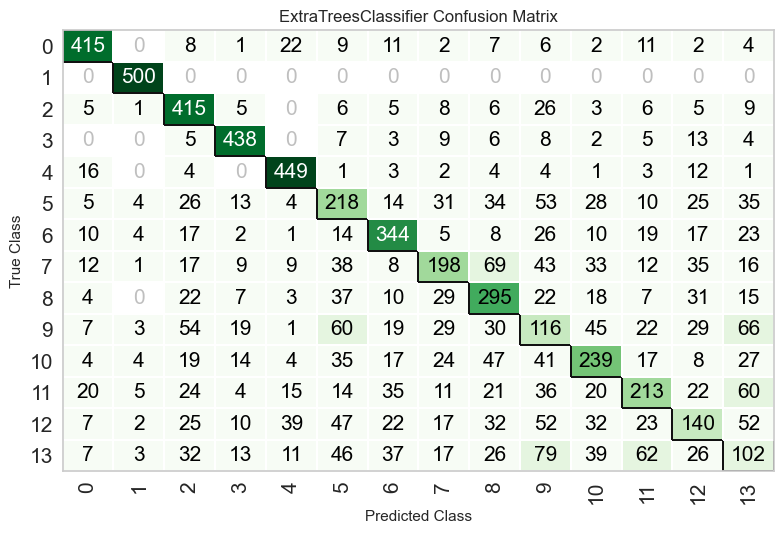

In [66]:
plot_model(tuned_model_et,plot='confusion_matrix')

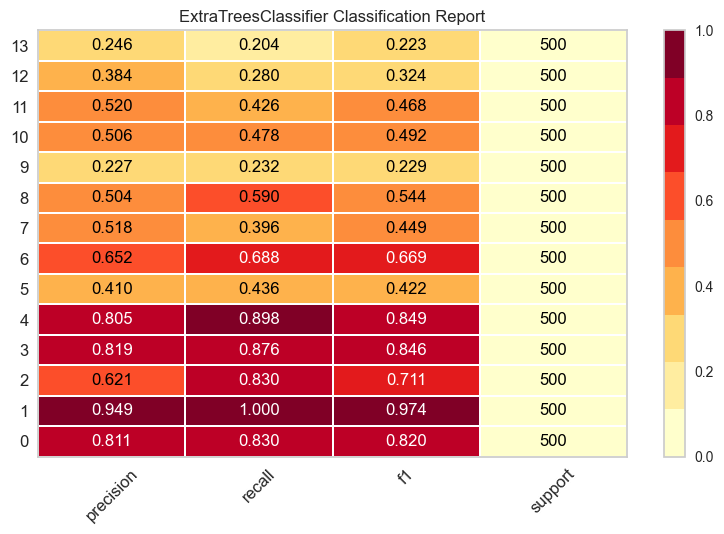

In [67]:
plot_model(tuned_model_et,plot='class_report')

In [68]:
predict_model(tuned_model_et)

,Model,Accuracy,AUC,Recall,Prec.,F1
0,Extra Trees Classifier,0.5831,0.8912,0.5831,0.5693,0.5729


,Text,Emotion,prediction_label,prediction_score
21000,rain,surprise,empty,0.5000
21001,much either going worse girl r home summer stink,hate,hate,0.4500
21002,happily married man show wedding ring swear hi...,joy,love,0.3800
21003,another lonely night,empty,empty,1.0000
21004,aww bbq fair chocolate,hate,hate,1.0000
...,...,...,...,...
27995,way dad sistas r p deb,sadness,boredom,0.3100
27996,started mess around something must distracted ...,joy,anger,0.6100
27997,warren died hannah killed gutted love warren e...,love,love,0.5900
27998,please everybody,empty,neutral,0.6744


# Version 2a : Création de modèle from scratch avec 14 émotions

In [7]:
from sklearn.model_selection import GridSearchCV

In [8]:
from pycaret.classification import *

In [9]:
df_test = pd.read_csv('emotions_test.csv')

In [10]:
df_test

,tweet_id,sentiment,author,content
0,1956967341,empty,xoshayzers,@tiffanylue i know i was listenin to bad habi...
1,1956967666,sadness,wannamama,Layin n bed with a headache ughhhh...waitin o...
2,1956967696,sadness,coolfunky,Funeral ceremony...gloomy friday...
3,1956967789,enthusiasm,czareaquino,wants to hang out with friends SOON!
4,1956968416,neutral,xkilljoyx,@dannycastillo We want to trade with someone w...
...,...,...,...,...
39995,1753918954,neutral,showMe_Heaven,@JohnLloydTaylor
39996,1753919001,love,drapeaux,Happy Mothers Day All my love
39997,1753919005,love,JenniRox,Happy Mother's Day to all the mommies out ther...
39998,1753919043,joy,ipdaman1,@niariley WASSUP BEAUTIFUL!!! FOLLOW ME!! PEE...


In [11]:
df_test = df_test[['sentiment','content']]

In [12]:
df_test = df_test.rename(columns={'sentiment':'Emotion','content':'Text'})

In [13]:
df_test

,Emotion,Text
0,empty,@tiffanylue i know i was listenin to bad habi...
1,sadness,Layin n bed with a headache ughhhh...waitin o...
2,sadness,Funeral ceremony...gloomy friday...
3,enthusiasm,wants to hang out with friends SOON!
4,neutral,@dannycastillo We want to trade with someone w...
...,...,...
39995,neutral,@JohnLloydTaylor
39996,love,Happy Mothers Day All my love
39997,love,Happy Mother's Day to all the mommies out ther...
39998,joy,@niariley WASSUP BEAUTIFUL!!! FOLLOW ME!! PEE...


In [14]:
df_test = pd.concat([df_test,df[['Emotion','Text']]],axis=0)

In [15]:
df_test

,Emotion,Text
0,empty,@tiffanylue i know i was listenin to bad habi...
1,sadness,Layin n bed with a headache ughhhh...waitin o...
2,sadness,Funeral ceremony...gloomy friday...
3,enthusiasm,wants to hang out with friends SOON!
4,neutral,@dannycastillo We want to trade with someone w...
...,...,...
21454,fear,Melissa stared at her friend in dism
21455,fear,Successive state elections have seen the gover...
21456,fear,Vincent was irritated but not dismay
21457,fear,Kendall-Hume turned back to face the dismayed ...


In [16]:
df_test['Emotion'].value_counts()

Emotion
joy           12238
sadness       11430
neutral        8638
worry          8459
love           5483
anger          3103
surprise       3066
fear           2652
fun            1776
relief         1526
hate           1323
empty           827
enthusiasm      759
boredom         179
Name: count, dtype: int64

In [17]:
import pandas as pd
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler

X = df_test.drop('Emotion', axis=1)
y = df_test['Emotion']


target_samples = 2000


rus = RandomUnderSampler(sampling_strategy={cls: target_samples for cls in y.value_counts().index if y.value_counts()[cls] > target_samples}, random_state=42)
ros = RandomOverSampler(sampling_strategy={cls: target_samples for cls in y.value_counts().index if y.value_counts()[cls] < target_samples}, random_state=42)


X_res, y_res = rus.fit_resample(X, y)


df_res = pd.concat([X_res, y_res], axis=1)


X_res, y_res = ros.fit_resample(df_res.drop('Emotion', axis=1), df_res['Emotion'])


df_res = pd.concat([X_res, y_res], axis=1)


df_res['Emotion'].value_counts()
df_test = df_res.copy()

In [18]:
%time df_test['Text'] = df_test['Text'].map(lambda x : ' '.join(re.sub("(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)"," ",x).split()))
df_test.head()

CPU times: user 112 ms, sys: 1.29 ms, total: 113 ms
Wall time: 112 ms


,Text,Emotion
0,i already feel the atmosphere around it seems ...,anger
1,i feel stressed out i would watch movies alone...,anger
2,i feel frustrated and upset and demotivated wh...,anger
3,i aint pissed angry mad or anything i just fee...,anger
4,She was acting like some idiotic schoolgirl no...,anger


In [19]:
%time df_test['Text'] = df_test['Text'].map(lambda x: x.lower())
df_test.head()

CPU times: user 2.47 ms, sys: 408 µs, total: 2.88 ms
Wall time: 2.67 ms


,Text,Emotion
0,i already feel the atmosphere around it seems ...,anger
1,i feel stressed out i would watch movies alone...,anger
2,i feel frustrated and upset and demotivated wh...,anger
3,i aint pissed angry mad or anything i just fee...,anger
4,she was acting like some idiotic schoolgirl no...,anger


In [20]:
%time df_test['Text'] = df_test['Text'].map(lambda x: re.sub(r'[^\w\s]', '', x))
df_test.head()

CPU times: user 19.4 ms, sys: 828 µs, total: 20.3 ms
Wall time: 19.8 ms


,Text,Emotion
0,i already feel the atmosphere around it seems ...,anger
1,i feel stressed out i would watch movies alone...,anger
2,i feel frustrated and upset and demotivated wh...,anger
3,i aint pissed angry mad or anything i just fee...,anger
4,she was acting like some idiotic schoolgirl no...,anger


In [21]:
%time df_test['Text'] = df_test['Text'].map(lambda x : re.sub(r'[^\x00-\x7F]+',' ', x))
df_test.head()

CPU times: user 25.4 ms, sys: 901 µs, total: 26.3 ms
Wall time: 25.7 ms


,Text,Emotion
0,i already feel the atmosphere around it seems ...,anger
1,i feel stressed out i would watch movies alone...,anger
2,i feel frustrated and upset and demotivated wh...,anger
3,i aint pissed angry mad or anything i just fee...,anger
4,she was acting like some idiotic schoolgirl no...,anger


In [22]:
# Les valeurs spécifiques que vous voulez trouver et supprimer
values_to_find = ['10', '11', '15', '1978', '1991', '30']

# Fonction pour supprimer tous les chiffres, les mots contenant des chiffres, et les valeurs spécifiques
def remove_digits_and_values(text, values):
    # Supprimer les mots contenant des chiffres
    text = re.sub(r'\b\w*\d\w*\b', '', text)
    # Supprimer les valeurs spécifiques
    for value in values:
        text = text.replace(value, '')
    return text

df_test['Text'] = df_test['Text'].apply(lambda x: remove_digits_and_values(x, values_to_find))

# Vérification de la suppression des chiffres
print(df_test.Text[df_test.Text.str.contains('.*[0-9].*', regex=True)])


Series([], Name: Text, dtype: object)


In [23]:
# Fonction pour supprimer tous les chiffres
df_test['Text'] = df_test['Text'].apply(lambda x: ''.join([i for i in x if not i.isdigit()]))

# Afficher les lignes contenant encore des chiffres (s'il y en a)
print(df_test.Text[df_test.Text.str.contains('.*[0-9].*', regex=True)])

Series([], Name: Text, dtype: object)


!pip install textblob

In [24]:
import re
from textblob import TextBlob
from textblob import Word

# Compilant l'expression régulière
rx = re.compile(r'([^\W\d_])\1{2,}')

# Fonction pour corriger le texte
def correct_text(text):
    return re.sub(r'[^\W\d_]+', lambda x: Word(rx.sub(r'\1\1', x.group())).correct() if rx.search(x.group()) else x.group(), text)

# Appliquer la correction à la colonne 'text'
df_test['Text'] = df_test['Text'].apply(correct_text)

df_test


,Text,Emotion
0,i already feel the atmosphere around it seems ...,anger
1,i feel stressed out i would watch movies alone...,anger
2,i feel frustrated and upset and demotivated wh...,anger
3,i aint pissed angry mad or anything i just fee...,anger
4,she was acting like some idiotic schoolgirl no...,anger
...,...,...
27995,done with my drew and jayk handmade gifts now ...,relief
27996,tired as hell bed time from cara nighty night ...,relief
27997,no but i just checked and got it lol you are o...,relief
27998,hubby needs a vacation thank god we re leaving...,relief


In [25]:
stop_words_test = stopwords.words('english')
%time df_test['Text'] = df_test['Text'].map(lambda x : ' '.join([w for w in x.split() if w not in stop_words_test]))
df_test.head()

CPU times: user 248 ms, sys: 997 µs, total: 249 ms
Wall time: 250 ms


,Text,Emotion
0,already feel atmosphere around seems dangerous,anger
1,feel stressed would watch movies alone walk st...,anger
2,feel frustrated upset demotivated dont see who...,anger
3,aint pissed angry mad anything feel pretty muc...,anger
4,acting like idiotic schoolgirl intelligent wom...,anger


In [26]:
df_test['Emotion'].unique()

array(['anger', 'boredom', 'empty', 'enthusiasm', 'fear', 'fun', 'hate',
       'joy', 'love', 'neutral', 'relief', 'sadness', 'surprise', 'worry'],
      dtype=object)

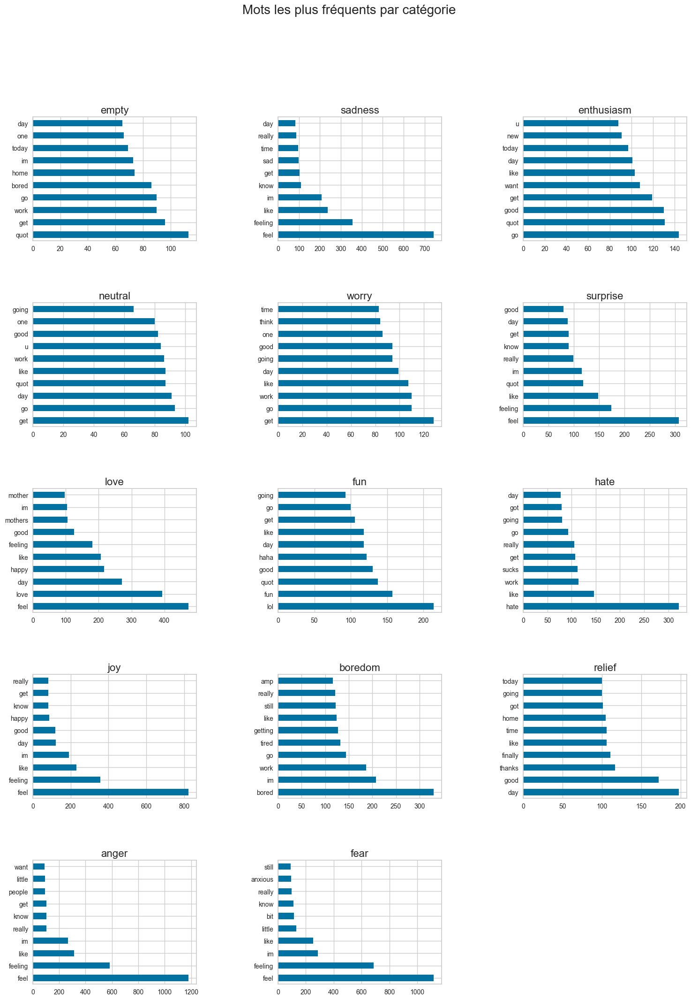

In [27]:
import matplotlib.pyplot as plt

# Liste des émotions à afficher
emotions = ['empty', 'sadness', 'enthusiasm', 'neutral', 'worry', 'surprise', 'love', 'fun', 'hate', 'joy', 'boredom', 'relief', 'anger','fear']

# Détermination du nombre de lignes et de colonnes nécessaires pour afficher toutes les émotions
num_rows = 5
num_cols = 3

# Création de la figure et des sous-plots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(18, 24))
fig.subplots_adjust(hspace=0.5, wspace=0.5)
fig.suptitle('Mots les plus fréquents par catégorie', size=20)

# Boucle pour tracer les mots les plus fréquents pour chaque émotion
for i, emotion in enumerate(emotions):
    row = i // num_cols
    col = i % num_cols
    ax = axes[row, col]
    df_test.loc[df_test['Emotion'] == emotion]['Text'].str.split(expand=True).stack().value_counts()[:10].plot(kind='barh', ax=ax)
    ax.set_title(emotion, size=16)

# Supprimer les sous-plots vides
for j in range(i+1, num_rows * num_cols):
    fig.delaxes(axes.flatten()[j])

plt.show()


In [28]:
new_stopwords_test = ["get","quot","day","go","work","u","good","feel","feeling","like","im","time","know"]
#,"going","time" , ,"im","really","know","want","going","time","one","little"
#new_stopwords = ["feel","feeling",'im',"get","know","want","would","one"," i m ","still","ive","think","something","like","really","time","little","make","people","even","thing"]

stop_words_test.extend(new_stopwords_test
                      )

In [29]:
%time df_test['Text'] = df_test['Text'].map(lambda x : ' '.join([w for w in x.split() if w not in stop_words_test]))
df_test.head()

CPU times: user 193 ms, sys: 1.39 ms, total: 195 ms
Wall time: 195 ms


,Text,Emotion
0,already atmosphere around seems dangerous,anger
1,stressed would watch movies alone walk streets...,anger
2,frustrated upset demotivated dont see whole pi...,anger
3,aint pissed angry mad anything pretty much fuc...,anger
4,acting idiotic schoolgirl intelligent woman th...,anger


In [30]:
%time df_test['Text'] = df_test['Text'].map(lambda x: re.sub(r'[^\w\s]', '', x))
df_test.head()

CPU times: user 13.2 ms, sys: 337 µs, total: 13.5 ms
Wall time: 13.3 ms


,Text,Emotion
0,already atmosphere around seems dangerous,anger
1,stressed would watch movies alone walk streets...,anger
2,frustrated upset demotivated dont see whole pi...,anger
3,aint pissed angry mad anything pretty much fuc...,anger
4,acting idiotic schoolgirl intelligent woman th...,anger


In [31]:
values_to_find = ['10', '11', '15', '1978', '1991', '30']

def remove_digits_and_values(text, values):
    text = re.sub(r'\b\w*\d\w*\b', '', text)
    for value in values:
        text = text.replace(value, '')
    return text

df_test['Text'] = df_test['Text'].apply(lambda x: remove_digits_and_values(x, values_to_find))

print(df_test.Text[df_test.Text.str.contains('.*[0-9].*', regex=True)])

Series([], Name: Text, dtype: object)


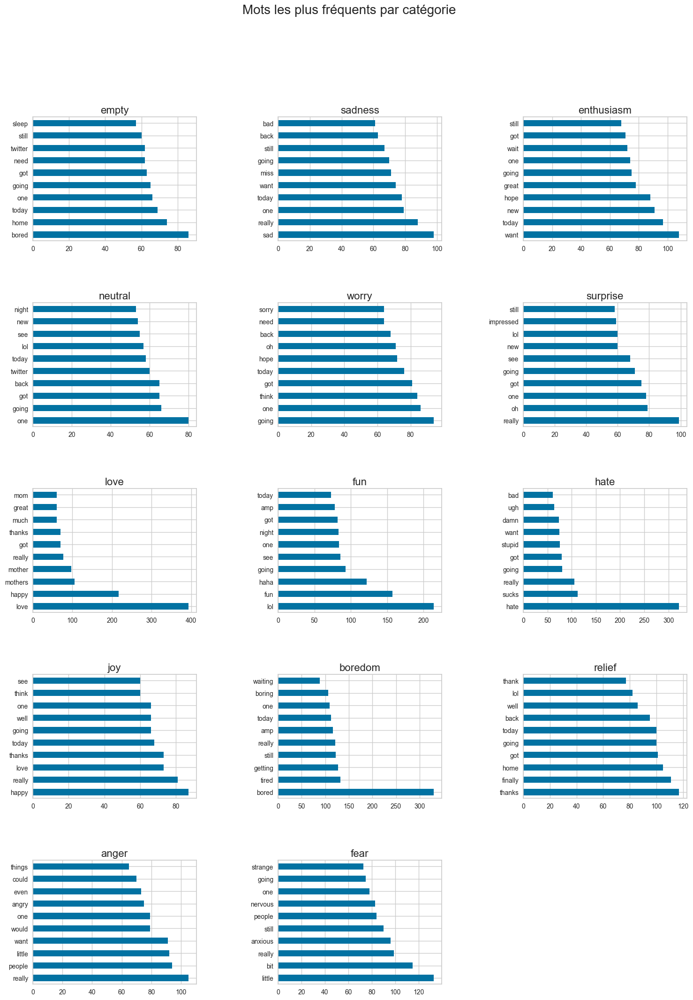

In [32]:
num_rows = 5
num_cols = 3

# Création de la figure et des sous-plots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(18, 24))
fig.subplots_adjust(hspace=0.5, wspace=0.5)
fig.suptitle('Mots les plus fréquents par catégorie', size=20)

# Boucle pour tracer les mots les plus fréquents pour chaque émotion
for i, emotion in enumerate(emotions):
    row = i // num_cols
    col = i % num_cols
    ax = axes[row, col]
    df_test.loc[df_test['Emotion'] == emotion]['Text'].str.split(expand=True).stack().value_counts()[:10].plot(kind='barh', ax=ax)
    ax.set_title(emotion, size=16)

# Supprimer les sous-plots vides
for j in range(i+1, num_rows * num_cols):
    fig.delaxes(axes.flatten()[j])

plt.show()


In [33]:
lemmer = WordNetLemmatizer()

%time df_test['Text'] = df_test['Text'].map(lambda x : ' '.join([lemmer.lemmatize(w) for w in x.split() if w not in stop_words_test]))
df_test.head()

CPU times: user 916 ms, sys: 9.7 ms, total: 926 ms
Wall time: 928 ms


,Text,Emotion
0,already atmosphere around seems dangerous,anger
1,stressed would watch movie alone walk street a...,anger
2,frustrated upset demotivated dont see whole pi...,anger
3,aint pissed angry mad anything pretty much fuc...,anger
4,acting idiotic schoolgirl intelligent woman th...,anger


In [34]:
%time df_test['Text'] = df_test['Text'].map(lambda x : ' '.join([w for w in x.split() if w not in stop_words_test]))
display(df_test.head())

CPU times: user 175 ms, sys: 1.8 ms, total: 177 ms
Wall time: 177 ms


,Text,Emotion
0,already atmosphere around seems dangerous,anger
1,stressed would watch movie alone walk street a...,anger
2,frustrated upset demotivated dont see whole pi...,anger
3,aint pissed angry mad anything pretty much fuc...,anger
4,acting idiotic schoolgirl intelligent woman th...,anger


## visualisations

! pip install wordcloud

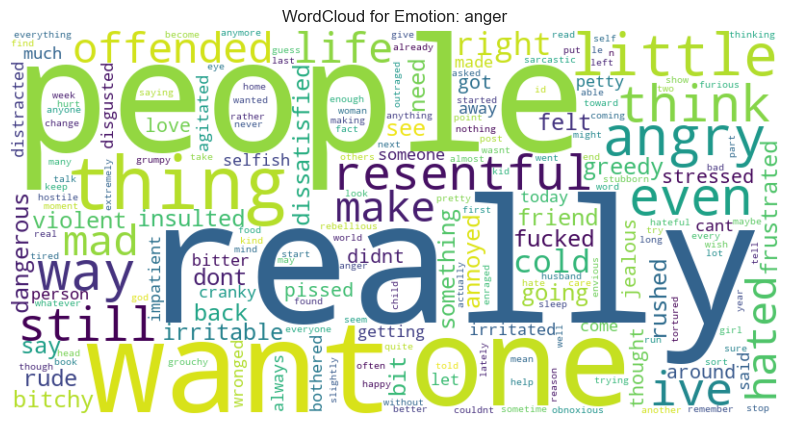

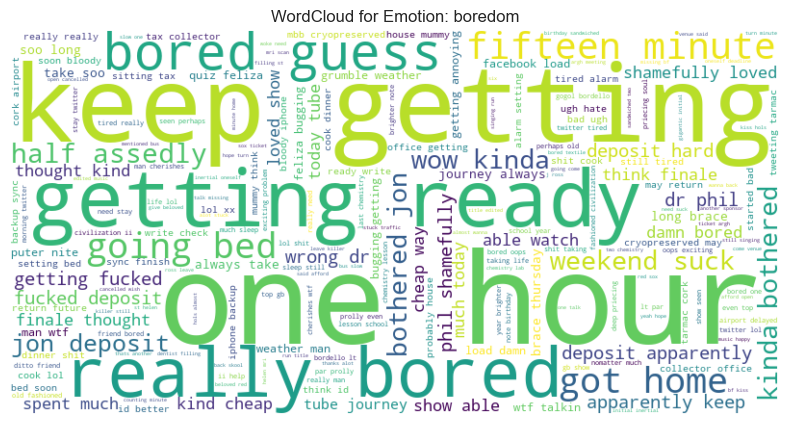

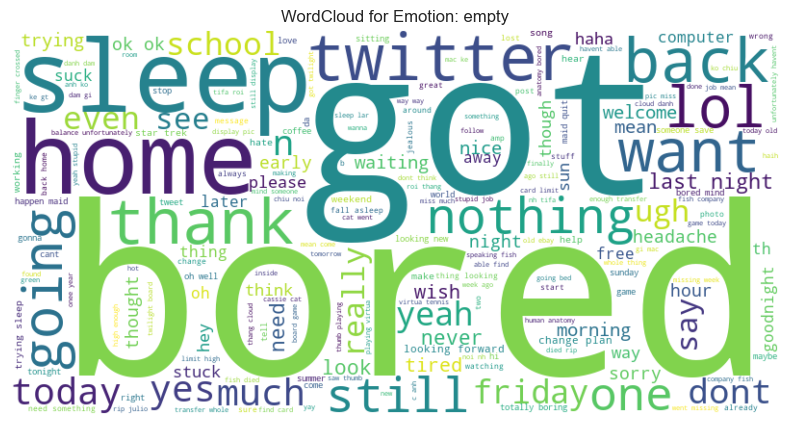

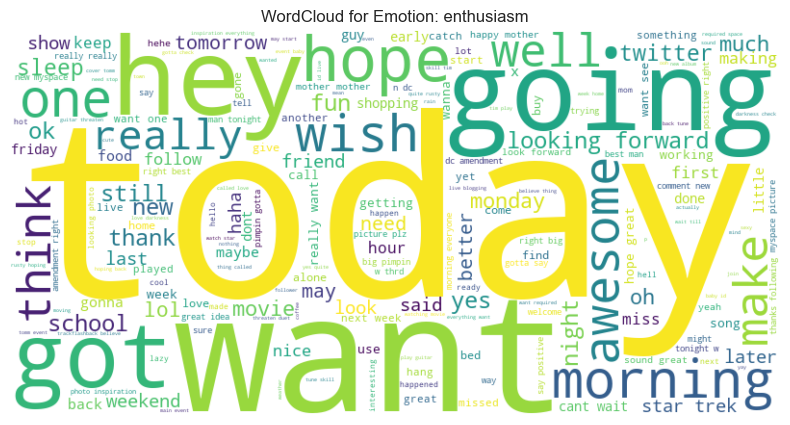

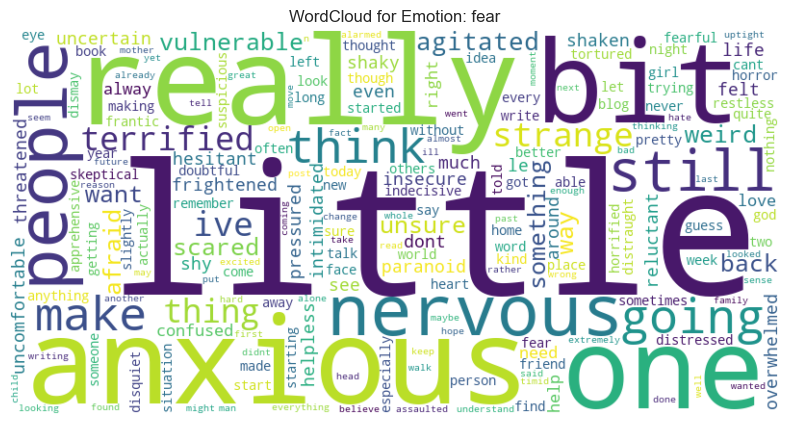

...

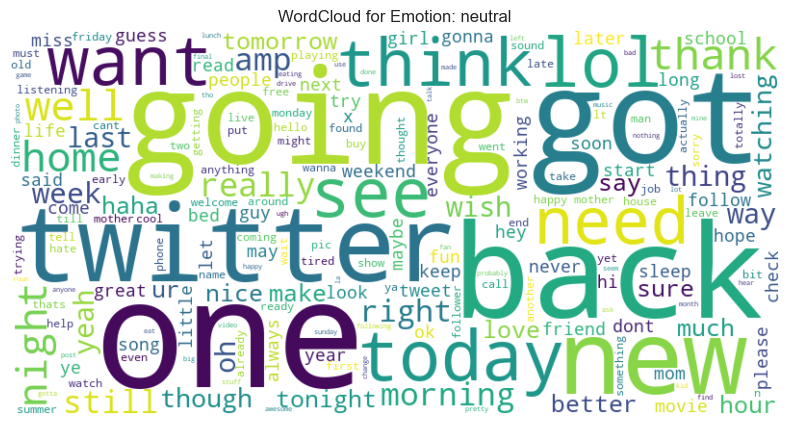

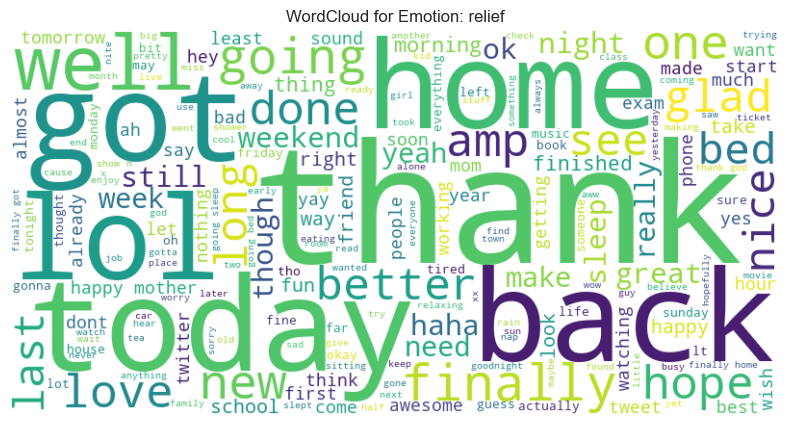

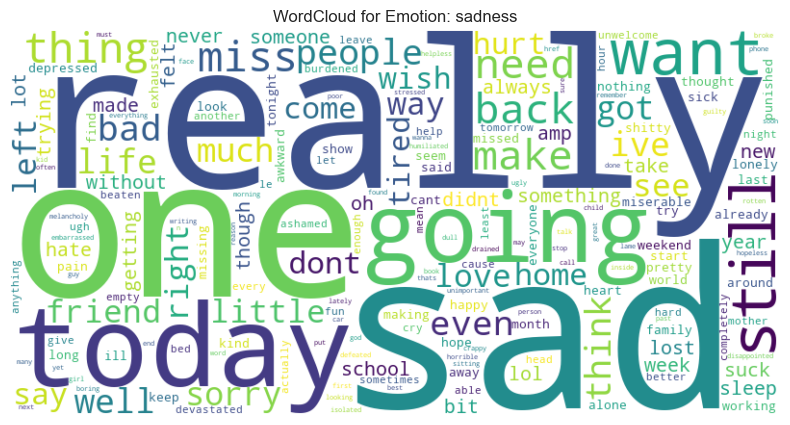

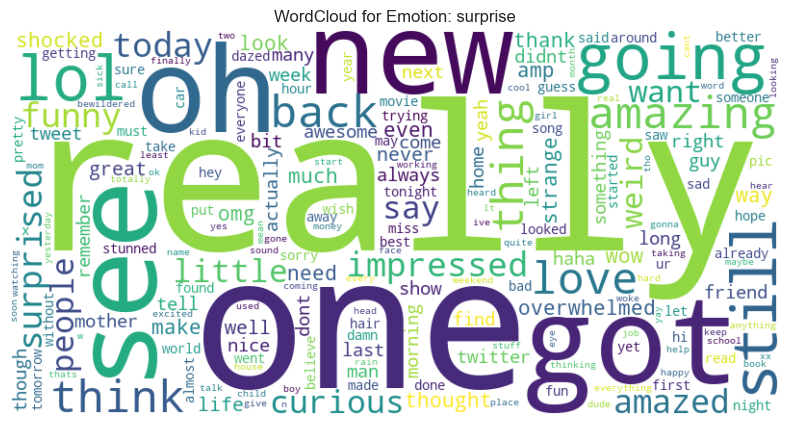

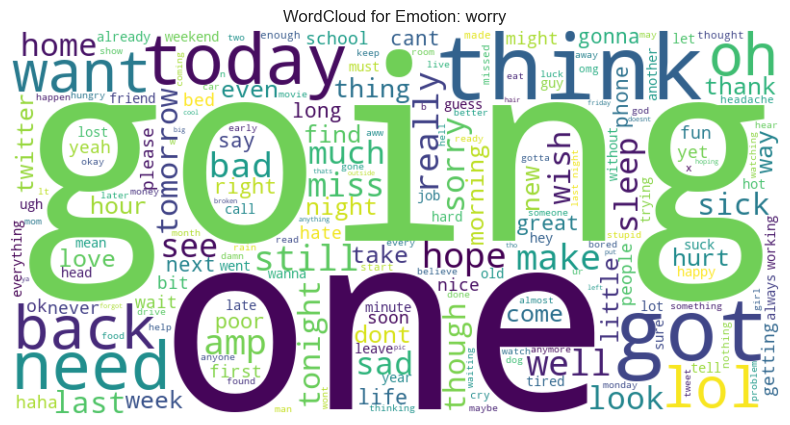

In [35]:
emotions = df_test['Emotion'].unique()
for emotion in emotions:
    # Filtrer les textes par émotion
    text = ' '.join(df_test[df_test['Emotion'] == emotion]['Text'])
    
    # Générer le WordCloud
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    
    # Afficher le WordCloud
    plt.figure(figsize=(10, 5))
    plt.title(f'WordCloud for Emotion: {emotion}')
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.show()

In [36]:
df_test_shuffle = shuffle(df_test, random_state=42)

In [37]:
train_size = int(0.8 * len(df_test_shuffle))

# Séparer les données en ensembles d'entraînement et de test
train_df = df_test_shuffle.iloc[:train_size]
test_df = df_test_shuffle.iloc[train_size:]

In [38]:
# Sauvegarder les jeux de données séparément
train_df.to_csv('fichier_train.csv', index=False)
test_df.to_csv('fichier_test.csv', index=False)


## Embedding

### Tf-IDF Vectorizer

In [39]:
def remove_triple_duplicates(text):
    if not text:
        return text
    
    result = [text[0]]
    count = 1 
    
    for char in text[1:]:
        if char == result[-1]:
            count += 1
            if count < 3:
                result.append(char)
        else:
            count = 1  
            result.append(char)
    
    return ''.join(result)


df_test['Text'] = df_test['Text'].apply(remove_triple_duplicates)


In [49]:
tfidf_vectorizer = TfidfVectorizer(min_df=2, max_df=0.80, ngram_range=(1,1),max_features=8000)

%time tpl_tfidf_test = tfidf_vectorizer.fit_transform(df_test['Text'])
display("Bow-TF:IDF :", tpl_tfidf_test.shape)
df_tfidf_test = pd.DataFrame(tpl_tfidf_test.toarray(), columns=tfidf_vectorizer.get_feature_names_out(), index=df_test.index)
display(df_tfidf_test.head())

CPU times: user 103 ms, sys: 3.02 ms, total: 106 ms
Wall time: 105 ms


'Bow-TF:IDF :'

(28000, 8000)

,aa,aah,aaron,aarrgghh,ab,abalone,abandon,abandoned,abandoning,abby,...,zelda,zend,zero,zipz,zirconcode,zombie,zone,zoned,zoo,zwarte
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [50]:
df_tfidf_test.columns

Index(['aa', 'aah', 'aaron', 'aarrgghh', 'ab', 'abalone', 'abandon',
       'abandoned', 'abandoning', 'abby',
       ...
       'zelda', 'zend', 'zero', 'zipz', 'zirconcode', 'zombie', 'zone',
       'zoned', 'zoo', 'zwarte'],
      dtype='object', length=8000)

In [51]:
#Preparing processed and BoW-TF:IDF embedded data for Classification
df_tfidf_m_test = pd.concat([df_test, df_tfidf_test], axis = 1)
df_tfidf_m_test.drop(columns=['Text'], inplace = True)
print(df_tfidf_m_test.shape)
display(df_tfidf_m_test.head())
display(df_tfidf_m_test.tail())

(28000, 8001)


,Emotion,aa,aah,aaron,aarrgghh,ab,abalone,abandon,abandoned,abandoning,...,zelda,zend,zero,zipz,zirconcode,zombie,zone,zoned,zoo,zwarte
0,anger,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,anger,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,anger,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,anger,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,anger,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


,Emotion,aa,aah,aaron,aarrgghh,ab,abalone,abandon,abandoned,abandoning,...,zelda,zend,zero,zipz,zirconcode,zombie,zone,zoned,zoo,zwarte
27995,relief,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
27996,relief,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
27997,relief,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
27998,relief,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
27999,relief,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## ACP

Train Data Dimensions :  (19600, 8000)
Validation Data Dimensions :  (4200, 8000)
Test Data Dimensions :  (4200, 8000)


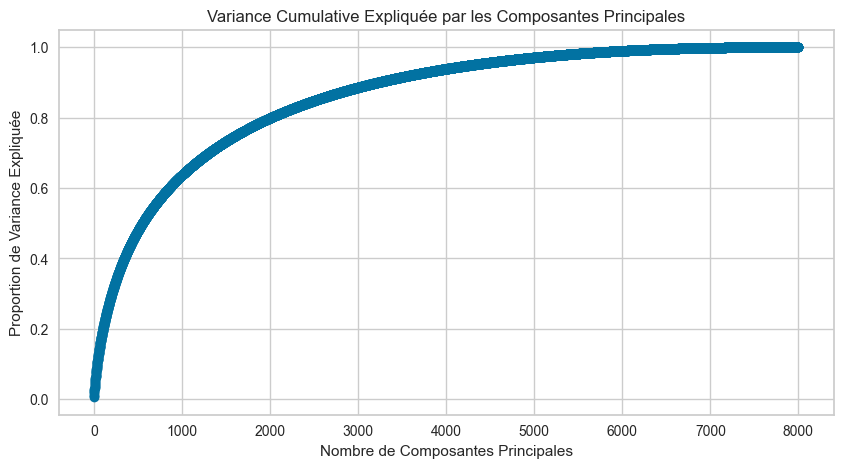

Nombre optimal de composantes pour expliquer 95.0% de la variance: 4299
Dimensions après ACP - Train:  (19600, 4299)
Dimensions après ACP - Validation:  (4200, 4299)
Dimensions après ACP - Test:  (4200, 4299)


In [69]:
# Charger les données
Y = df_tfidf_m_test['Emotion']
X = df_tfidf_m_test.drop('Emotion', axis=1)

# Séparer les données en train, validation et test
X_train, X_temp, Y_train, Y_temp = train_test_split(X, Y, train_size=0.70, stratify=Y, random_state=21)
X_val, X_test, Y_val, Y_test = train_test_split(X_temp, Y_temp, train_size=0.50, stratify=Y_temp, random_state=21)

print("Train Data Dimensions : ", X_train.shape)
print("Validation Data Dimensions : ", X_val.shape)
print("Test Data Dimensions : ", X_test.shape)

# Application de l'ACP
pca = PCA()
pca.fit(X_train)

# Visualisation de la variance expliquée
explained_variance = pca.explained_variance_ratio_
cumulative_variance = np.cumsum(explained_variance)

plt.figure(figsize=(10, 5))
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o', linestyle='--')
plt.title('Variance Cumulative Expliquée par les Composantes Principales')
plt.xlabel('Nombre de Composantes Principales')
plt.ylabel('Proportion de Variance Expliquée')
plt.grid(True)
plt.show()

# Nombre optimal de composantes pour expliquer 95% de la variance
threshold = 0.95
n_components_optimal = np.argmax(cumulative_variance >= threshold) + 1
print(f"Nombre optimal de composantes pour expliquer {threshold*100}% de la variance: {n_components_optimal}")

# Application de l'ACP avec le nombre optimal de composantes
pca = PCA(n_components=n_components_optimal)
X_train_pca = pca.fit_transform(X_train)
X_val_pca = pca.transform(X_val)
X_test_pca = pca.transform(X_test)

print("Dimensions après ACP - Train: ", X_train_pca.shape)
print("Dimensions après ACP - Validation: ", X_val_pca.shape)
print("Dimensions après ACP - Test: ", X_test_pca.shape)


In [71]:
def model_dvt_2_(X_train_pca, Y_train, X_val_pca, Y_val):
    classifiers = [
        ("Random Forest", RandomForestClassifier(n_estimators=400, criterion="entropy", random_state=21)),
        ("Extra Trees", ExtraTreesClassifier(n_estimators=400, criterion="entropy", random_state=21)),
        ("Gradient Boosting", GradientBoostingClassifier(n_estimators=100, max_depth=1, random_state=21, learning_rate=1.0)),
        ("Naive Bayes", MultinomialNB(alpha=0.5))
    ]
    
    for name, clf in classifiers:
        print("\n", name)
        %time clf.fit(X_train_pca, Y_train)
        Y_pred = clf.predict(X_val_pca)
        probs = clf.predict_proba(X_val_pca)
        clf_report_2_(Y_val, Y_pred, name)

In [72]:
def clf_report_2_(Y_test, Y_pred, clf_name):
    print("\n", f"Confusion Matrix - {clf_name}")
    cm = confusion_matrix(Y_test, Y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='YlGnBu', xticklabels=['anger', 'boredom', 'empty', 'enthusiasm', 'fear', 'fun', 'hate',
       'joy', 'love', 'neutral', 'relief', 'sadness', 'surprise', 'worry'], yticklabels=['anger', 'boredom', 'empty', 'enthusiasm', 'fear', 'fun', 'hate',
       'joy', 'love', 'neutral', 'relief', 'sadness', 'surprise', 'worry'])
    plt.xlabel('True Label')
    plt.ylabel('Predicted Label')
    plt.title(f'Confusion Matrix - {clf_name}')
    plt.show()
    
    print("\n", f"Classification Report - {clf_name}", "\n")
    print(classification_report(Y_test, Y_pred))
    print("Overall Accuracy : ", round(accuracy_score(Y_test, Y_pred) * 100, 2))
    print("Precision Score : ", round(precision_score(Y_test, Y_pred, average='weighted') * 100, 2))
    print("Recall Score : ", round(recall_score(Y_test, Y_pred, average='weighted') * 100, 2))
    print("--------------------------------------------------------------------------")



Models on Term Frequency - Bag of Words: Inverse Document Frequency data

 Random Forest
CPU times: user 3min 51s, sys: 454 ms, total: 3min 51s
Wall time: 3min 53s

 Confusion Matrix - Random Forest


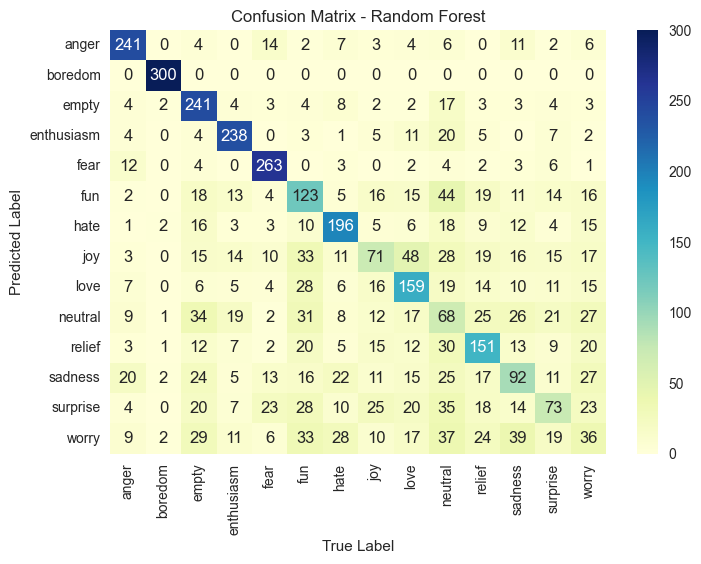


 Classification Report - Random Forest 

              precision    recall  f1-score   support

       anger       0.76      0.80      0.78       300
     boredom       0.97      1.00      0.98       300
       empty       0.56      0.80      0.66       300
  enthusiasm       0.73      0.79      0.76       300
        fear       0.76      0.88      0.81       300
         fun       0.37      0.41      0.39       300
        hate       0.63      0.65      0.64       300
         joy       0.37      0.24      0.29       300
        love       0.48      0.53      0.51       300
     neutral       0.19      0.23      0.21       300
      relief       0.49      0.50      0.50       300
     sadness       0.37      0.31      0.33       300
    surprise       0.37      0.24      0.29       300
       worry       0.17      0.12      0.14       300

    accuracy                           0.54      4200
   macro avg       0.52      0.54      0.52      4200
weighted avg       0.52      0.54     

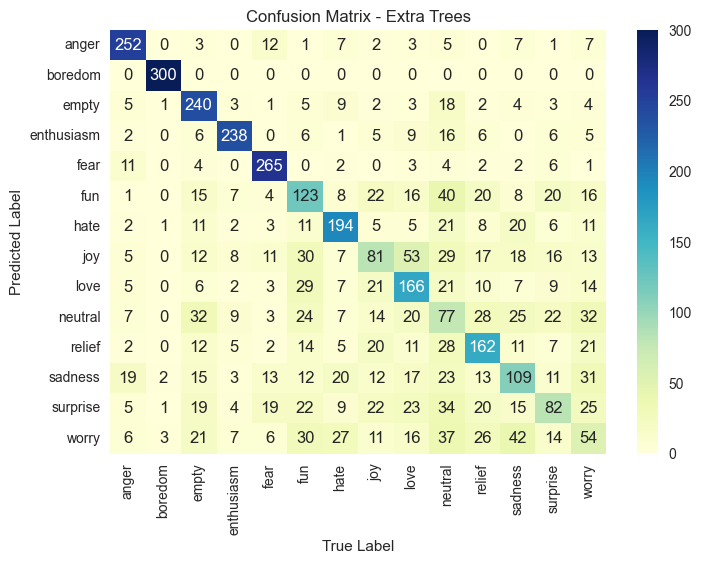


 Classification Report - Extra Trees 

              precision    recall  f1-score   support

       anger       0.78      0.84      0.81       300
     boredom       0.97      1.00      0.99       300
       empty       0.61      0.80      0.69       300
  enthusiasm       0.83      0.79      0.81       300
        fear       0.77      0.88      0.83       300
         fun       0.40      0.41      0.41       300
        hate       0.64      0.65      0.64       300
         joy       0.37      0.27      0.31       300
        love       0.48      0.55      0.51       300
     neutral       0.22      0.26      0.24       300
      relief       0.52      0.54      0.53       300
     sadness       0.41      0.36      0.38       300
    surprise       0.40      0.27      0.33       300
       worry       0.23      0.18      0.20       300

    accuracy                           0.56      4200
   macro avg       0.55      0.56      0.55      4200
weighted avg       0.55      0.56      0

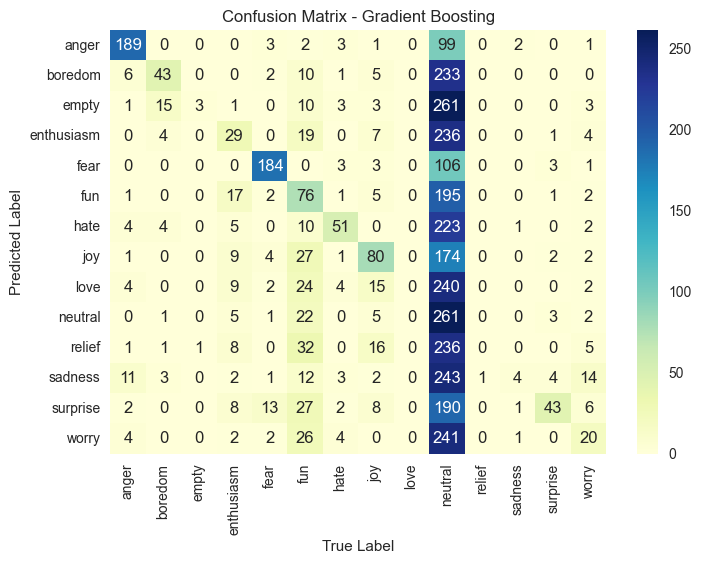


 Classification Report - Gradient Boosting 

              precision    recall  f1-score   support

       anger       0.84      0.63      0.72       300
     boredom       0.61      0.14      0.23       300
       empty       0.75      0.01      0.02       300
  enthusiasm       0.31      0.10      0.15       300
        fear       0.86      0.61      0.72       300
         fun       0.26      0.25      0.25       300
        hate       0.67      0.17      0.27       300
         joy       0.53      0.27      0.36       300
        love       0.00      0.00      0.00       300
     neutral       0.09      0.87      0.16       300
      relief       0.00      0.00      0.00       300
     sadness       0.44      0.01      0.03       300
    surprise       0.75      0.14      0.24       300
       worry       0.31      0.07      0.11       300

    accuracy                           0.23      4200
   macro avg       0.46      0.23      0.23      4200
weighted avg       0.46      0.23 

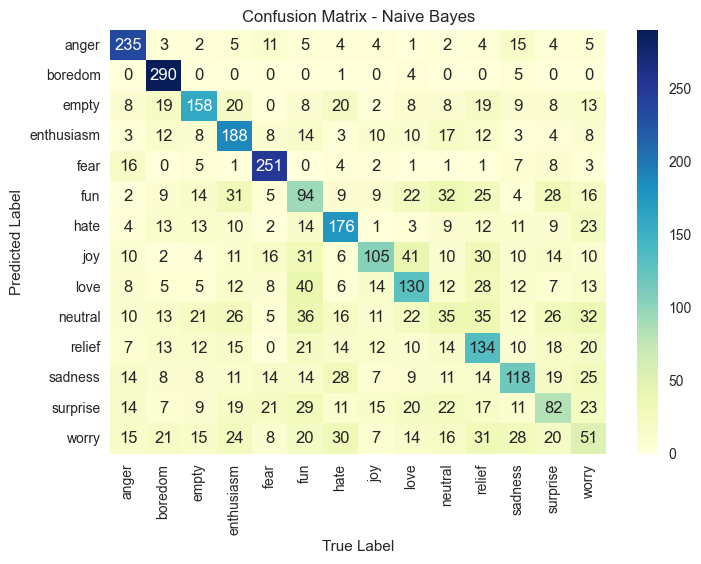


 Classification Report - Naive Bayes 

              precision    recall  f1-score   support

       anger       0.68      0.78      0.73       300
     boredom       0.70      0.97      0.81       300
       empty       0.58      0.53      0.55       300
  enthusiasm       0.50      0.63      0.56       300
        fear       0.72      0.84      0.77       300
         fun       0.29      0.31      0.30       300
        hate       0.54      0.59      0.56       300
         joy       0.53      0.35      0.42       300
        love       0.44      0.43      0.44       300
     neutral       0.19      0.12      0.14       300
      relief       0.37      0.45      0.40       300
     sadness       0.46      0.39      0.43       300
    surprise       0.33      0.27      0.30       300
       worry       0.21      0.17      0.19       300

    accuracy                           0.49      4200
   macro avg       0.47      0.49      0.47      4200
weighted avg       0.47      0.49      0

In [73]:
print('Models on Term Frequency - Bag of Words: Inverse Document Frequency data')
%time model_dvt_2_(X_train_pca, Y_train, X_val_pca, Y_val)

# Version 2b : Pycarest avec 14 émotions 

In [56]:
%time df_setup = setup(data = df_test, target = 'Emotion', train_size = 0.75,text_features=['Text'],index=False,fold=5) 

,Description,Value
0,Session id,3559
1,Target,Emotion
2,Target type,Multiclass
3,Target mapping,"anger: 0, boredom: 1, empty: 2, enthusiasm: 3, fear: 4, fun: 5, hate: 6, joy: 7, love: 8, neutral: 9, relief: 10, sadness: 11, surprise: 12, worry: 13"
4,Original data shape,"(28000, 2)"
5,Transformed data shape,"(28000, 16857)"
6,Transformed train set shape,"(21000, 16857)"
7,Transformed test set shape,"(7000, 16857)"
8,Text features,1
9,Preprocess,True


CPU times: user 3.14 s, sys: 2.87 s, total: 6.01 s
Wall time: 7.8 s


In [58]:
remove_metric('MCC') 

In [59]:
remove_metric('kappa') 

In [60]:
get_metrics()

,Name,Display Name,Score Function,Scorer,Target,Args,Greater is Better,Multiclass,Custom
ID,,,,,,,,,
acc,Accuracy,Accuracy,<function accuracy_score at 0x302e725c0>,accuracy,pred,{},True,True,False
auc,AUC,AUC,<pycaret.internal.metrics.BinaryMulticlassScor...,"make_scorer(roc_auc_score, response_method=('d...",pred_proba,"{'average': 'weighted', 'multi_class': 'ovr'}",True,True,False
recall,Recall,Recall,<pycaret.internal.metrics.BinaryMulticlassScor...,"make_scorer(recall_score, response_method='pre...",pred,{'average': 'weighted'},True,True,False
precision,Precision,Prec.,<pycaret.internal.metrics.BinaryMulticlassScor...,"make_scorer(precision_score, response_method='...",pred,{'average': 'weighted'},True,True,False
f1,F1,F1,<pycaret.internal.metrics.BinaryMulticlassScor...,"make_scorer(f1_score, response_method='predict...",pred,{'average': 'weighted'},True,True,False


In [61]:
%time compare_models(fold=2)

,Model,Accuracy,AUC,Recall,Prec.,F1,TT (Sec)
et,Extra Trees Classifier,0.5076,0.8532,0.5076,0.4993,0.5004,19.3200
rf,Random Forest Classifier,0.4980,0.8455,0.4980,0.4904,0.4897,11.7000
ridge,Ridge Classifier,0.4871,0.0000,0.4871,0.4692,0.4748,20.5900
svm,SVM - Linear Kernel,0.4800,0.0000,0.4800,0.4618,0.4604,6.1350
dt,Decision Tree Classifier,0.4638,0.7199,0.4638,0.4509,0.4535,24.6850
lr,Logistic Regression,0.4619,0.0000,0.4619,0.4511,0.4542,13.6600
gbc,Gradient Boosting Classifier,0.4296,0.0000,0.4296,0.4854,0.4392,389.8750
catboost,CatBoost Classifier,0.4138,0.8130,0.4138,0.4466,0.4164,125.9250
lightgbm,Light Gradient Boosting Machine,0.3562,0.7673,0.3562,0.3577,0.3546,9.7500
nb,Naive Bayes,0.3260,0.6423,0.3260,0.2983,0.2992,5.8500


CPU times: user 7min 10s, sys: 3.48 s, total: 7min 13s
Wall time: 45min 21s


ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='sqrt',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_samples_leaf=1,
                     min_samples_split=2, min_weight_fraction_leaf=0.0,
                     monotonic_cst=None, n_estimators=100, n_jobs=-1,
                     oob_score=False, random_state=3559, verbose=0,
                     warm_start=False)

## Création du modèle Extra Tree Classifier

In [62]:
%time model_et = create_model('et',fold=4)

,Accuracy,AUC,Recall,Prec.,F1
Fold,,,,,
0,0.5526,0.8758,0.5526,0.5470,0.5457
1,0.5472,0.8711,0.5472,0.5382,0.5403
2,0.5699,0.8830,0.5699,0.5601,0.5623
3,0.5573,0.8760,0.5573,0.5527,0.5521
Mean,0.5568,0.8765,0.5568,0.5495,0.5501
Std,0.0084,0.0042,0.0084,0.0080,0.0082


CPU times: user 7min 5s, sys: 1.81 s, total: 7min 7s
Wall time: 3min 27s


## Optimisation du modèle

In [63]:
%time tuned_model_et = tune_model(model_et,fold=6)

,Accuracy,AUC,Recall,Prec.,F1
Fold,,,,,
0,0.3451,0.7704,0.3451,0.3573,0.3253
1,0.3477,0.7848,0.3477,0.3527,0.3272
2,0.3546,0.7727,0.3546,0.3579,0.3367
3,0.3534,0.7742,0.3534,0.3528,0.3345
4,0.3617,0.7809,0.3617,0.3684,0.3494
5,0.3434,0.7654,0.3434,0.3599,0.3345
Mean,0.3510,0.7747,0.3510,0.3582,0.3346
Std,0.0063,0.0064,0.0063,0.0053,0.0078


Fitting 6 folds for each of 10 candidates, totalling 60 fits
Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
CPU times: user 7min 14s, sys: 3.48 s, total: 7min 17s
Wall time: 15min 36s


In [64]:
tuned_model_et

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='sqrt',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_samples_leaf=1,
                     min_samples_split=2, min_weight_fraction_leaf=0.0,
                     monotonic_cst=None, n_estimators=100, n_jobs=-1,
                     oob_score=False, random_state=3559, verbose=0,
                     warm_start=False)

## Evaluation du modèle

In [65]:
%time evaluate_model(tuned_model_et)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

CPU times: user 578 ms, sys: 1.63 s, total: 2.21 s
Wall time: 455 ms


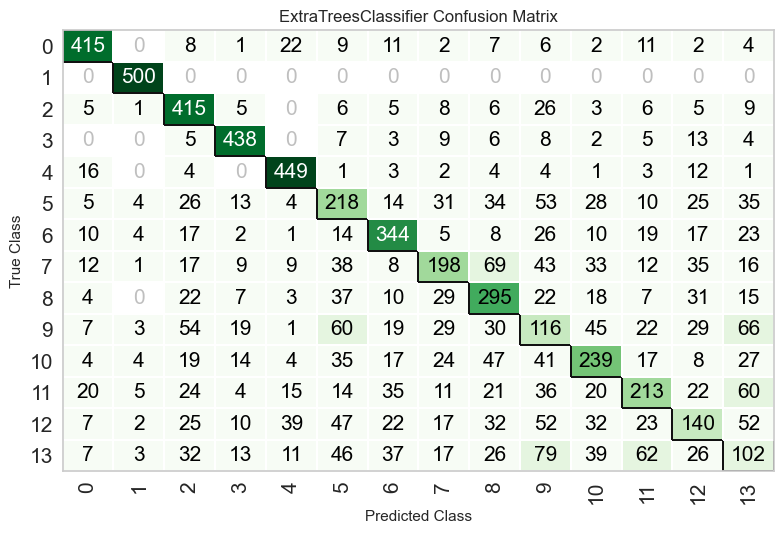

In [66]:
plot_model(tuned_model_et,plot='confusion_matrix')

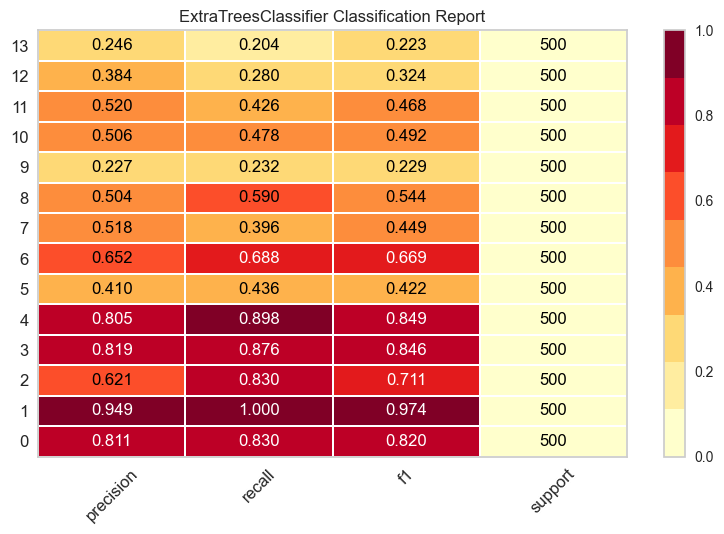

In [67]:
plot_model(tuned_model_et,plot='class_report')

In [68]:
predict_model(tuned_model_et)

,Model,Accuracy,AUC,Recall,Prec.,F1
0,Extra Trees Classifier,0.5831,0.8912,0.5831,0.5693,0.5729


,Text,Emotion,prediction_label,prediction_score
21000,rain,surprise,empty,0.5000
21001,much either going worse girl r home summer stink,hate,hate,0.4500
21002,happily married man show wedding ring swear hi...,joy,love,0.3800
21003,another lonely night,empty,empty,1.0000
21004,aww bbq fair chocolate,hate,hate,1.0000
...,...,...,...,...
27995,way dad sistas r p deb,sadness,boredom,0.3100
27996,started mess around something must distracted ...,joy,anger,0.6100
27997,warren died hannah killed gutted love warren e...,love,love,0.5900
27998,please everybody,empty,neutral,0.6744
